# Run ConvexGating on large PBMC panel

We use the `convexgating` tool to compute gates for a simple flow data set with a large PBMC panel.

In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
import os

In [7]:
import convexgating as cg 
from convex_hull_add_on import add_tight_analysis

In [8]:
from contour_scatter import contour_lines_separate_outliers, generate_lut_func, prepare_contour_plot

In [2]:
import scanpy as sc
import anndata as ann
import pandas as pd

In [3]:
import matplotlib.pyplot as plt 
from matplotlib import rcParams
import numpy as np

In [4]:
import datetime
now = datetime.datetime.now()
today = now.strftime("%Y%m%d")

In [9]:
sc.logging.print_versions()
sc.settings.verbosity = 3 

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.8.0
scanpy      1.8.1
sinfo       0.3.4
-----
PIL                                 8.4.0
anyio                               NA
asciitree                           NA
attr                                21.2.0
autoreload                          NA
babel                               2.9.1
backcall                            0.2.0
beta_ufunc                          NA
binom_ufunc                         NA
brotli                              1.0.9
certifi                             2021.10

## Read data

In [10]:
data_path = './../data/Convex_gating_test_MB/'

In [11]:
adata = sc.read(data_path + 'anndata/' + 'HIV_data_annotated_final.h5ad')

In [8]:
adata

AnnData object with n_obs × n_vars = 1142610 × 27
    obs: 'sample', 'FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'Time', 'gate_root', 'gate_PBMC', 'gate_Single Cells', 'gate_Living', 'gate_B cells', 'gate_B cells (no class switch)', 'gate_B cells (switched memory)', 'gate_Living--others', 'gate_NK cells', 'gate_CD16high NK', 'gate_NK Immature', 'gate_NK Mature', 'gate_CD16low NK', 'gate_Living--others--others', 'gate_CD16 Monos', 'gate_Conv. Monos', 'gate_Int. Monos', 'gate_others--others--others', 'gate_cDCs', 'gate_pDCs', 'gate_Pre-DCs', 'gate_Living--T cells', 'gate_NKT', 'gate_CD4+NKT', 'gate_CD8+NKT', 'gate_otherNKT', 'gate_T cells--T cells', 'gate_CD4+ T cells', 'gate_CM CD4', 'gate_Eff. CD4', 'gate_Naive CD4', 'gate_PD1+ CD4 T cells', 'gate_TD CD4', 'gate_CD8+T cells', 'gate_CM CD8', 'gate_Eff. CD8', 'gate_Naive CD8', 'gate_TD CD8', 'batch', 'louvain', 'cluster cell_type_lvl_1', 'cluster cell_type_lvl_2'
    var: 'channel', 'marker', 'signal_type', 'channel_tmp'
    un

In [9]:
adata.obs['cluster cell_type_lvl_1'].cat.categories

Index(['B cell', 'Dendritic cell', 'Monocyte', 'NK cell', 'T cell',
       'not annotated'],
      dtype='object')

## Run ConvexGating

Here we run ConvexGating on all samples, downsampled to 50,000 cells. Afterwards, we re-compute the gating performance per sample.

In [41]:
from utils import run_convex_gating

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.8.0
scanpy      1.8.1
sinfo       0.3.4
-----
Cython                      0.29.24
PIL                         8.4.0
anyio                       NA
asciitree                   NA
attr                        21.2.0
babel                       2.9.1
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      1.0.9
certifi                     2021.10.08
cffi                        1.15.0
charset_normalizer          2.0.7
cloudpickl

In [ ]:
group = ['B cell', 'Dendritic cell', 'Monocyte', 'NK cell', 'T cell'] #
cluster_string = 'cell_type_lvl_1'
cell_data = cg.preprocess_adata_gating(adata, cluster_string = cluster_string)
save_path = './../data/Convex_gating_test_MB/cg_lvl1/'
keys, gating_core, gating_overview = cg.FIND_GATING_STRATEGY(cell_data = cell_data,
                                                            channels = list(adata.var.index),
                                                            cluster_numbers = group,
                                                            cluster_string = cluster_string,
                                                            save_path = save_path
                                                            )
for key in keys:
    gating_overview[key].to_csv(f'{save_path}/cluster_{keys[key]}/gate_overview.csv')

In [14]:
save_path = './../data/Convex_gating_test_MB/cg_lvl1/'
key = 'cluster cell_type_lvl_1'
subsample = 50000
verbose=True
adata_path='./../data/Convex_gating_test_MB/anndata/HIV_data_annotated_final.h5ad'

Key cell_type_lvl_1
Group B cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.885556     0.886408     0.888303     0.889183     0.889920
recall        0.812201     0.807416     0.806220     0.803828     0.802632
precision     0.973477     0.982533     0.988995     0.994819     0.998512


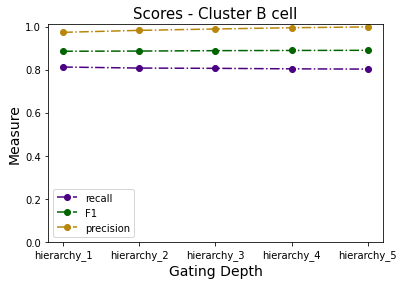

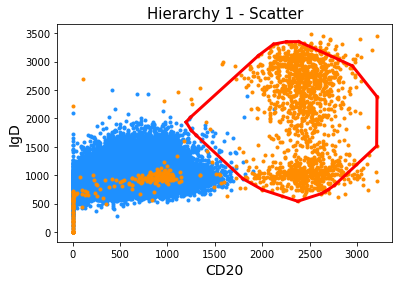

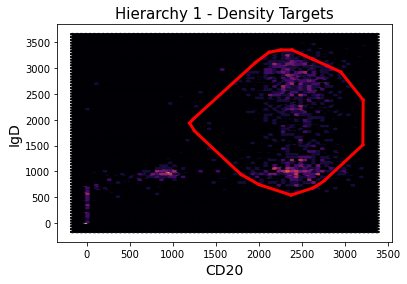

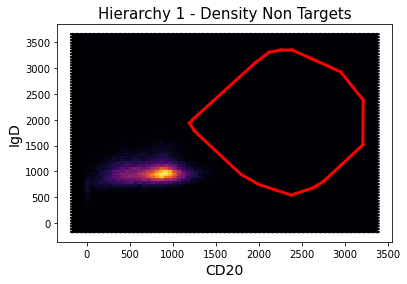

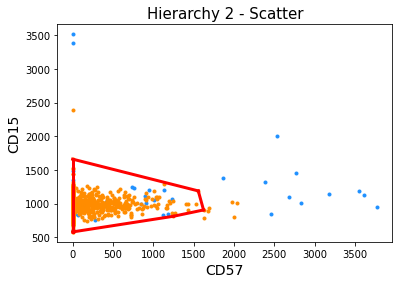

...

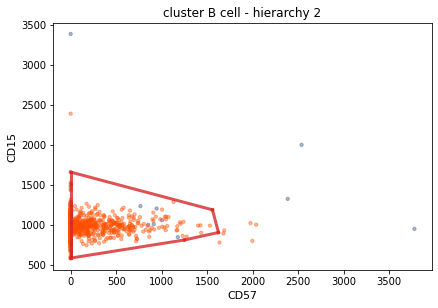

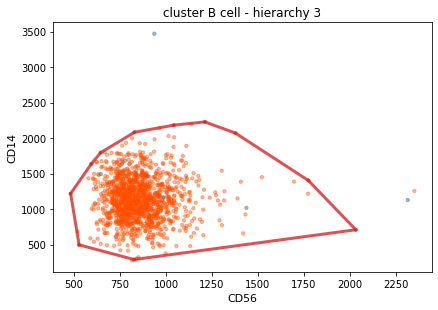

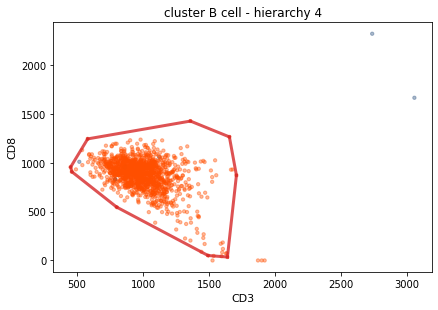

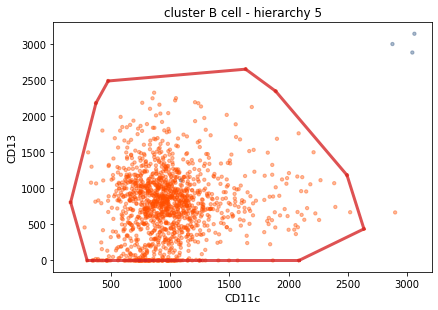

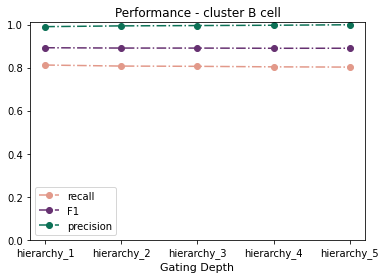

Key cell_type_lvl_1
Group Dendritic cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.111500     0.363545     0.448653     0.432311     0.407945
recall        0.382692     0.347115     0.296154     0.277885     0.256731
precision     0.065257     0.381607     0.924925     0.973064     0.992565


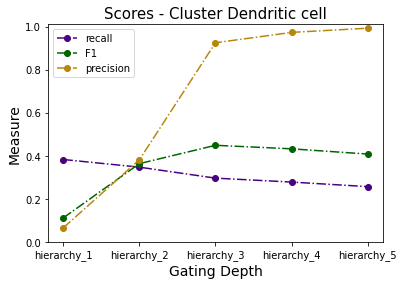

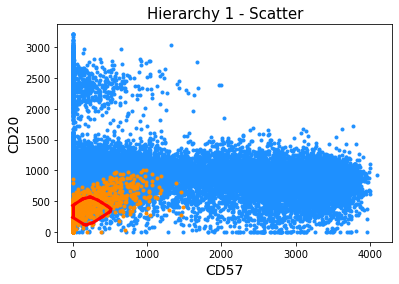

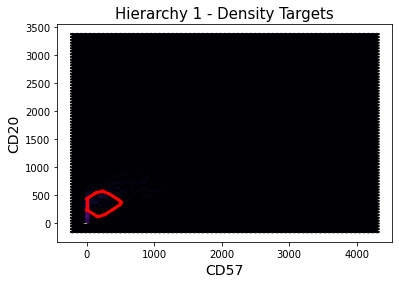

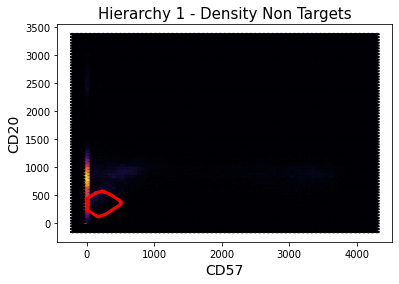

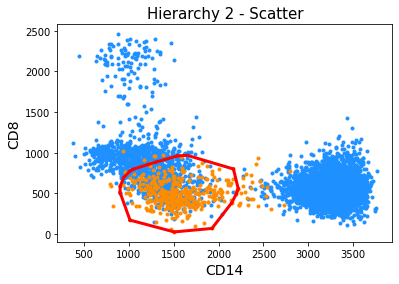

...

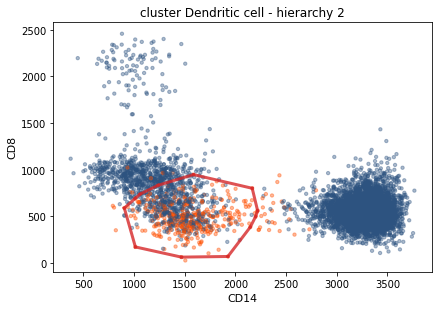

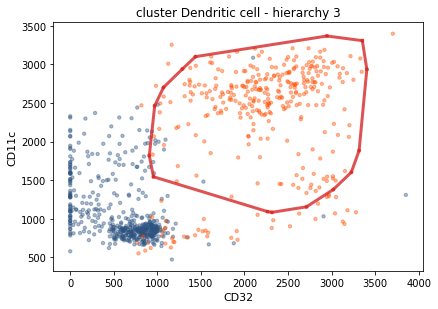

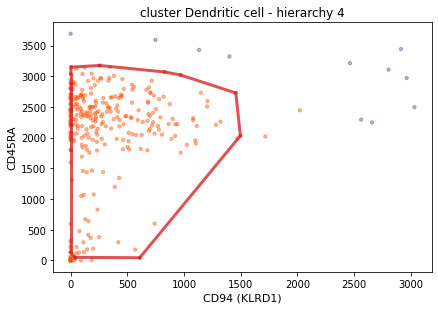

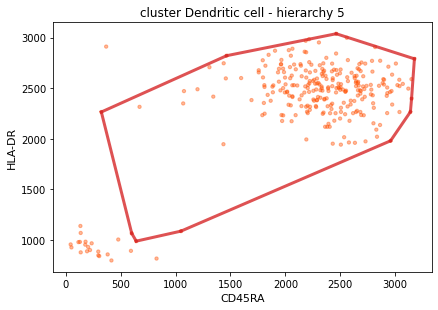

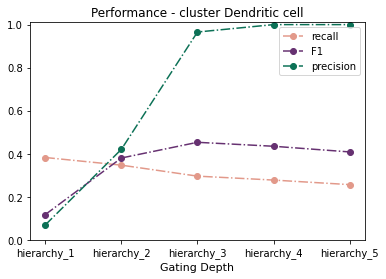

Key cell_type_lvl_1
Group Monocyte
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.927801     0.934650     0.926580     0.925529     0.925881
recall        0.896370     0.893054     0.878687     0.873757     0.872396
precision     0.961517     0.980310     0.979994     0.983823     0.986351


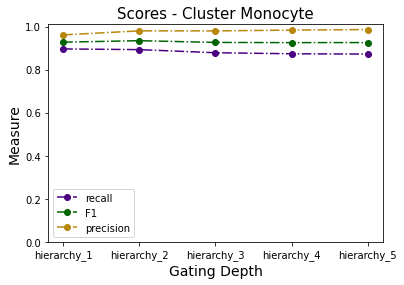

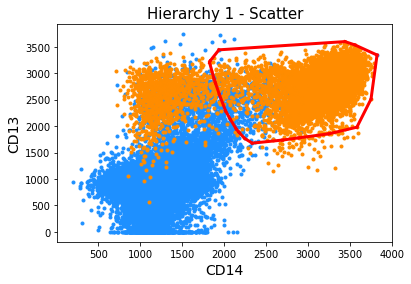

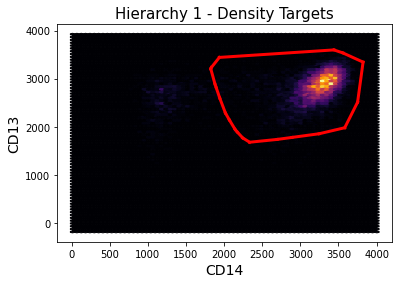

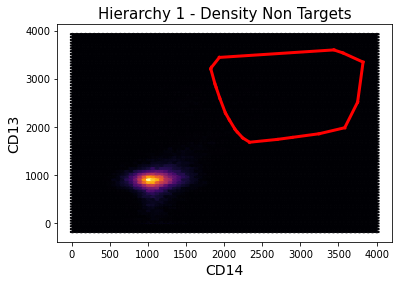

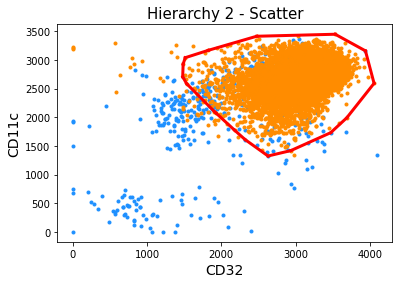

...

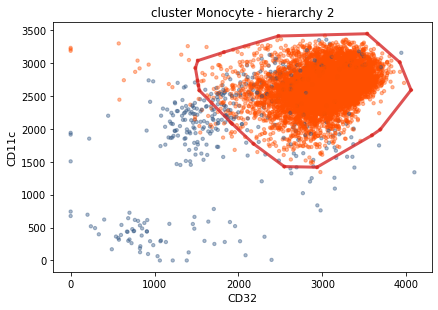

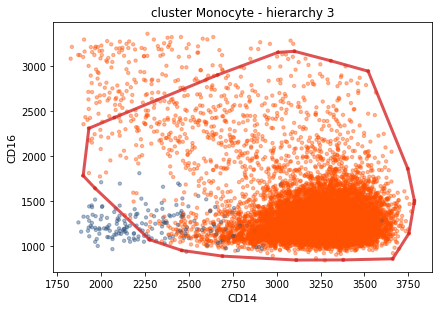

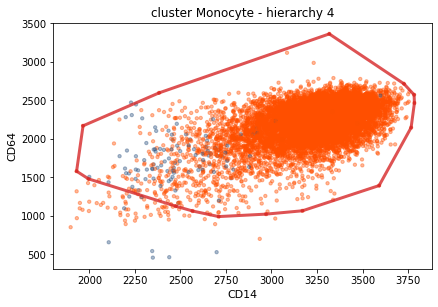

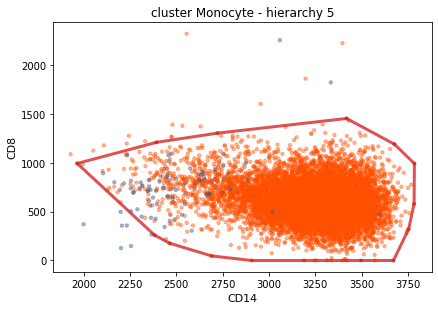

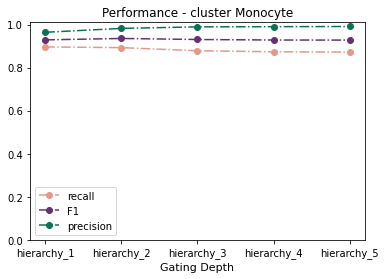

Key cell_type_lvl_1
Group NK cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.742791     0.812691     0.874761     0.866059     0.864666
recall        0.846451     0.780269     0.777640     0.763878     0.761713
precision     0.661750     0.847925     0.999602     0.999798     0.999797


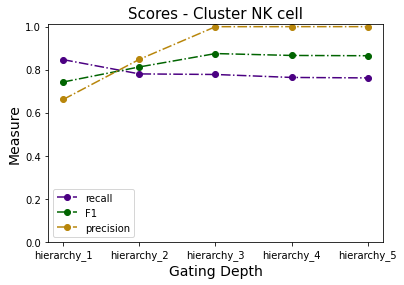

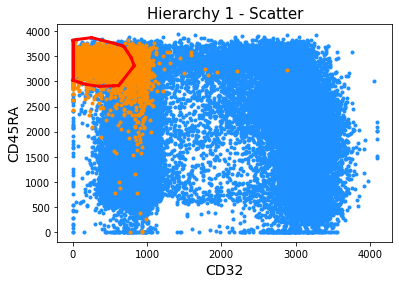

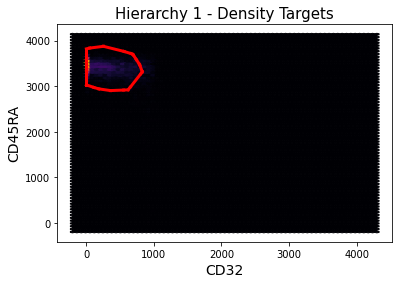

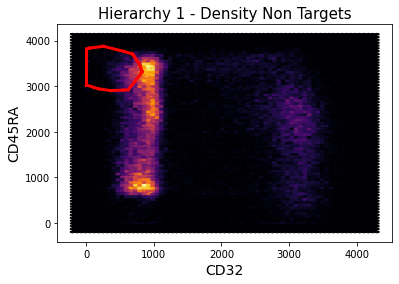

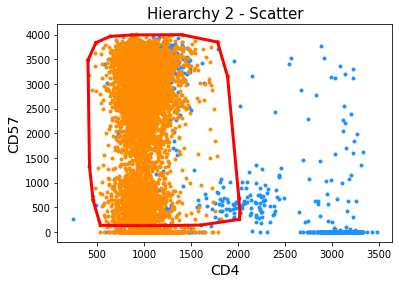

...

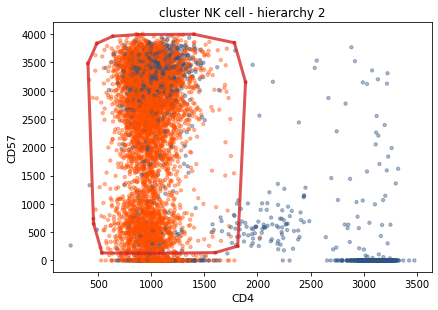

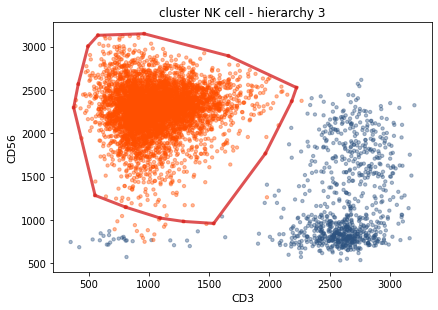

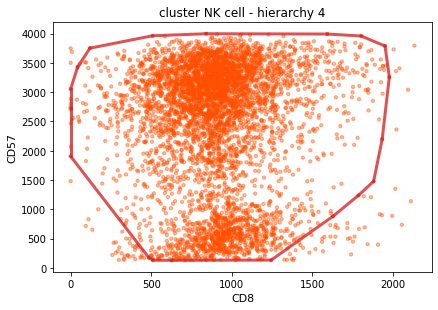

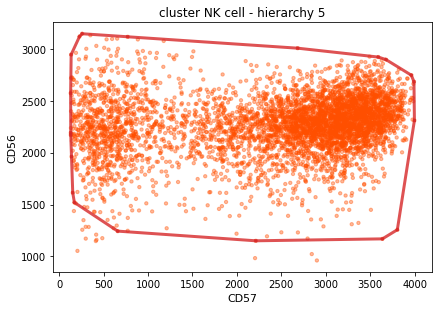

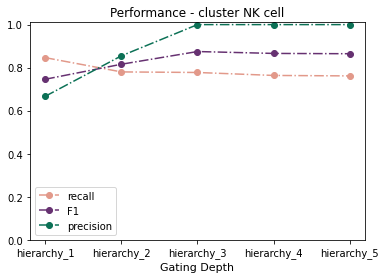

Key cell_type_lvl_1
Group T cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.950550     0.975361     0.974843     0.936133     0.936133
recall        0.974579     0.954533     0.951492     0.880215     0.880215
precision     0.927677     0.997119     0.999369     0.999639     0.999639


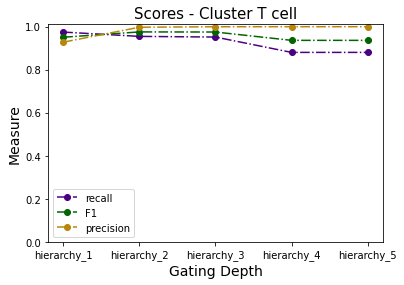

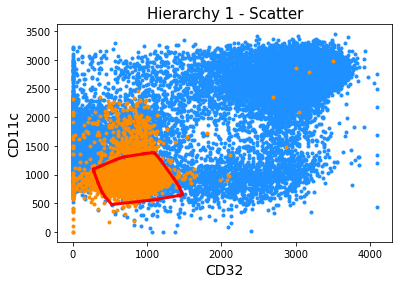

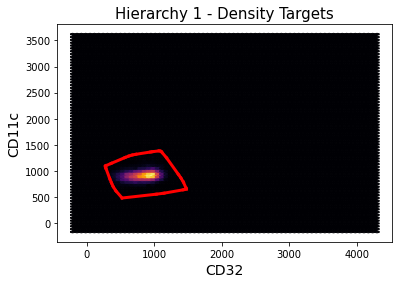

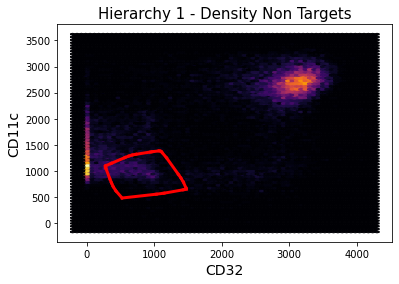

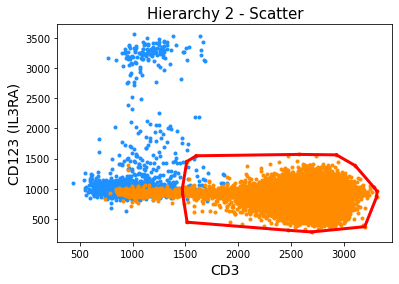

...

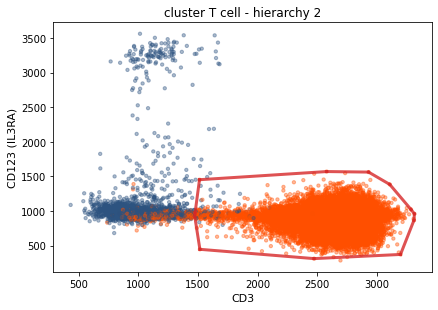

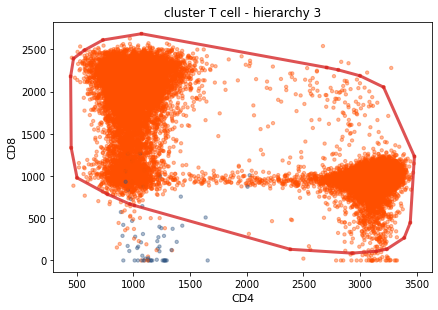

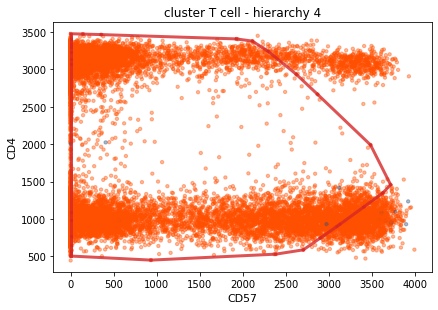

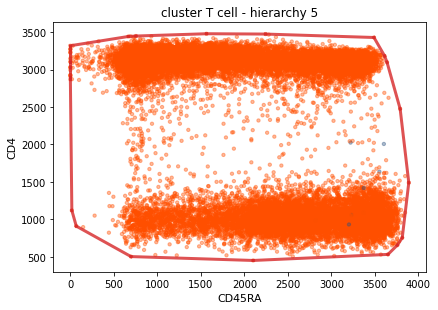

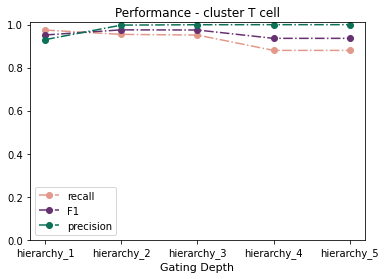

In [11]:
for group in adata.obs[key].cat.categories:
    if group=='not annotated':
        continue

    run_convex_gating(data = adata_path, 
                      key = key,
                      group = group,
                      batch = None,
                      subsample = subsample,
                      save_path = save_path,
                      verbose = verbose
                     )

Run for an individual cell type. Here Dendritic cells.

Key cluster cell_type_lvl_1
Group Dendritic cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4
f1            0.214738     0.517647     0.495971     0.495446
recall        0.389831     0.372881     0.335351     0.329298
precision     0.148182     0.846154     0.951890     1.000000


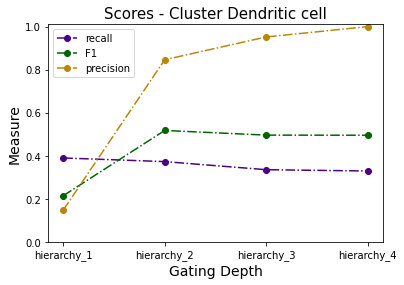

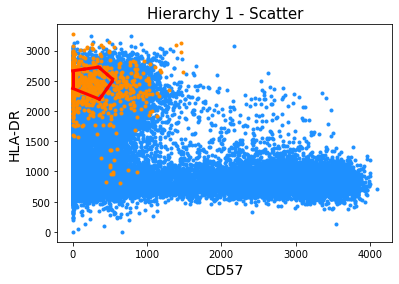

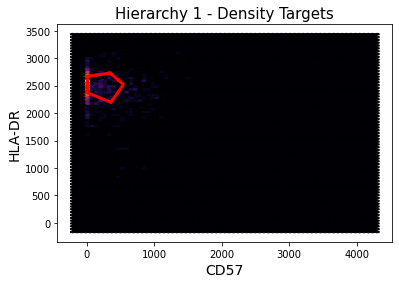

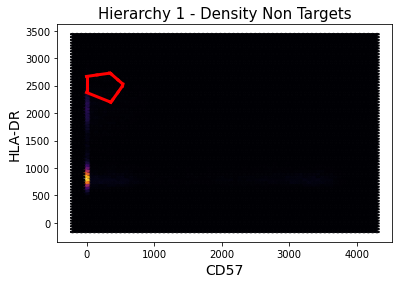

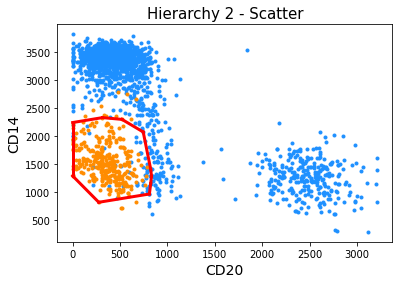

...

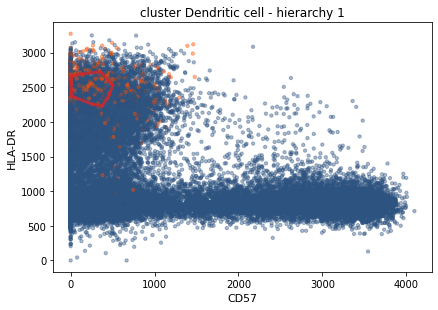

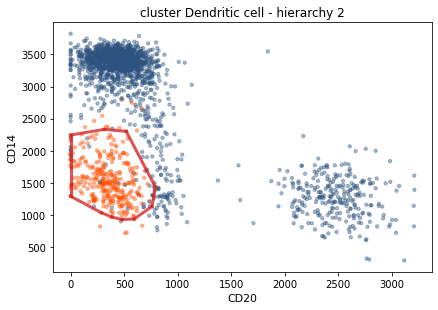

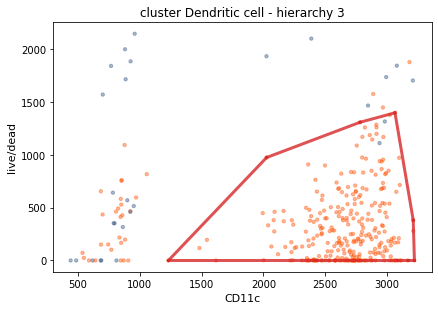

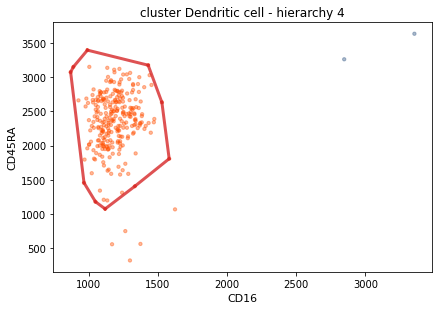

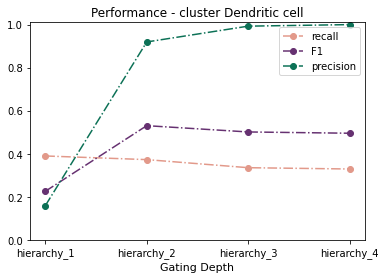

In [15]:
group='Dendritic cell'
run_convex_gating(data = adata_path, 
                      key = key,
                      group = group,
                      batch = None,
                      subsample = subsample,
                      save_path = save_path,
                      verbose = verbose
                     )

Load metadata.

In [15]:
metadata = {}
for group in adata.obs[key].cat.categories:
    if (group=='not annotated') | (group=='NK T cell'):
        continue
    metadata[group] = np.load(os.path.join(save_path, 'cluster_'+group, 'meta_info.npy'), allow_pickle=True).item()
        

In [16]:
metadata.keys()

dict_keys(['B cell', 'Dendritic cell', 'Monocyte', 'NK cell', 'T cell'])

In [17]:
save_path = './../data/Convex_gating_test_MB/cg_lvl2/'
key = 'cluster cell_type_lvl_2'
subsample = 50000
verbose=True
adata_path='./../data/Convex_gating_test_MB/anndata/HIV_data_annotated_final.h5ad'

Key cell_type_lvl_2
Group B cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.885556     0.886408     0.888303     0.889183     0.889920
recall        0.812201     0.807416     0.806220     0.803828     0.802632
precision     0.973477     0.982533     0.988995     0.994819     0.998512


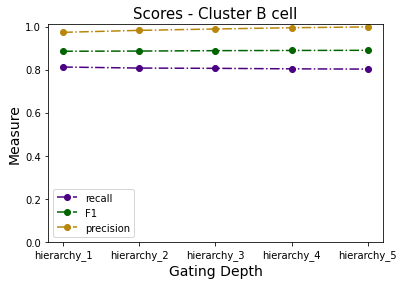

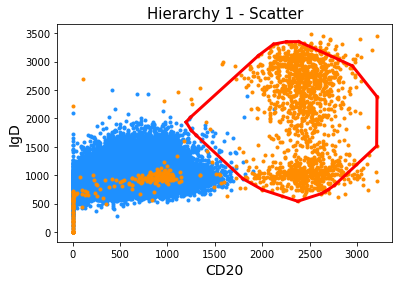

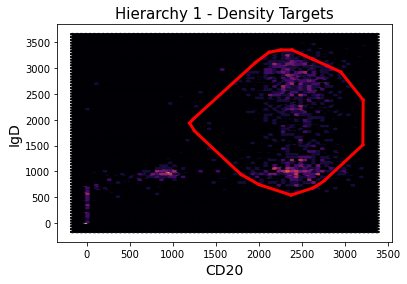

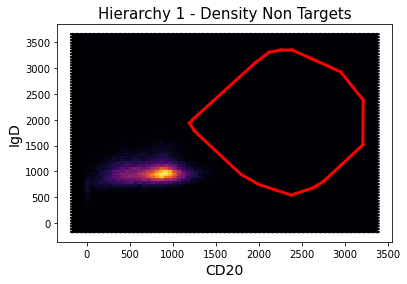

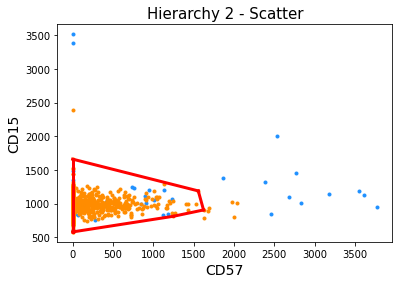

...

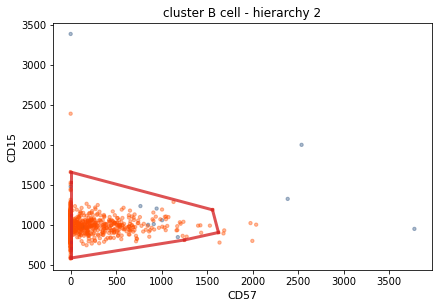

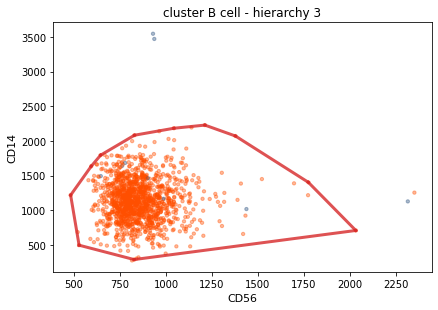

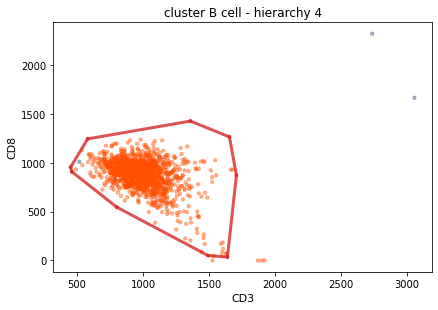

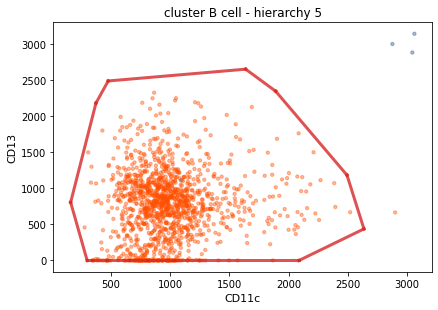

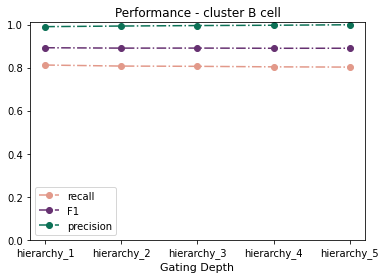

Key cell_type_lvl_2
Group CD4+ T cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.993870     0.994198     0.992712     0.990480     0.958195
recall        0.995305     0.995245     0.987842     0.983148     0.921517
precision     0.992438     0.993153     0.997629     0.997923     0.997914


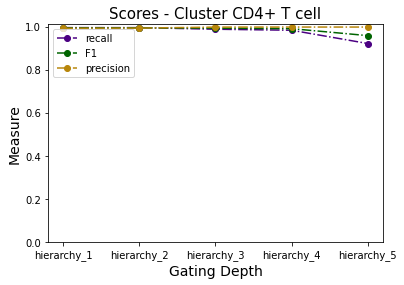

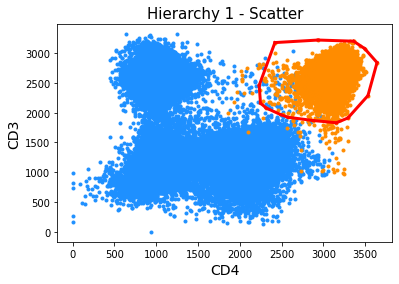

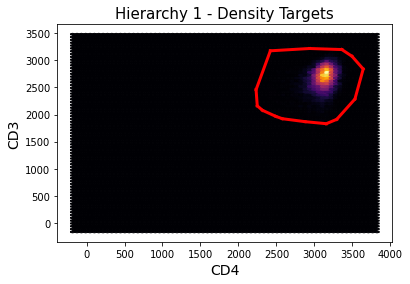

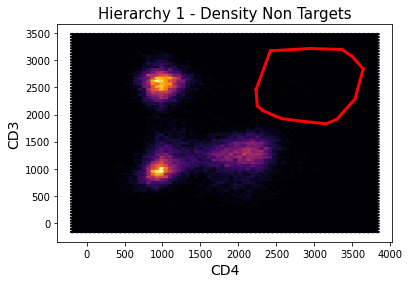

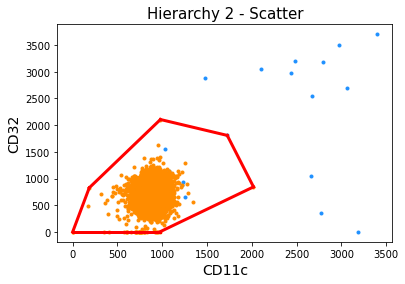

...

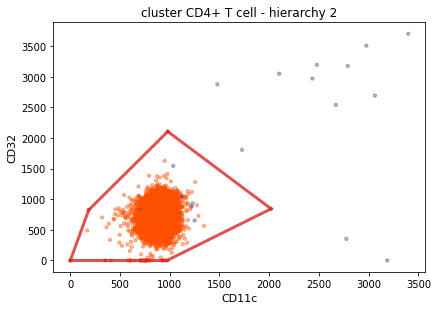

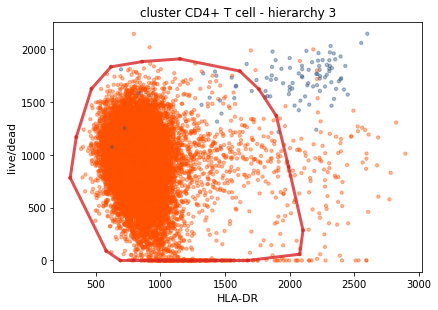

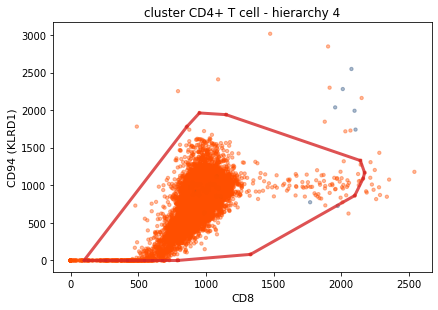

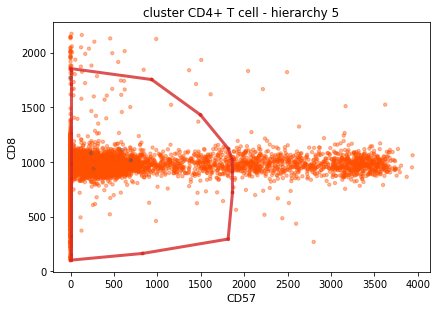

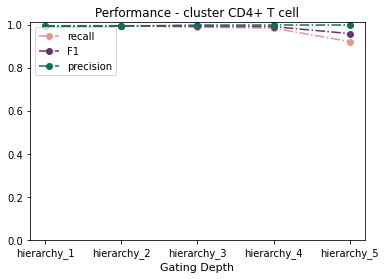

Key cell_type_lvl_2
Group CD8+ T cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.918423     0.933639     0.922577     0.920130     0.920068
recall        0.903205     0.889424     0.868643     0.864377     0.864268
precision     0.934163     0.982482     0.983651     0.983572     0.983570


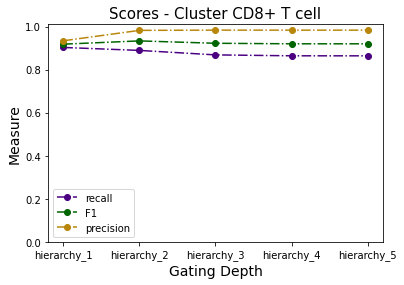

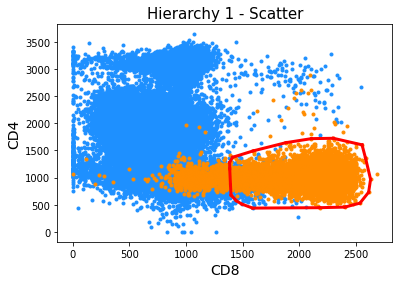

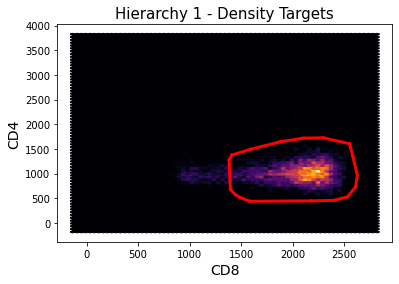

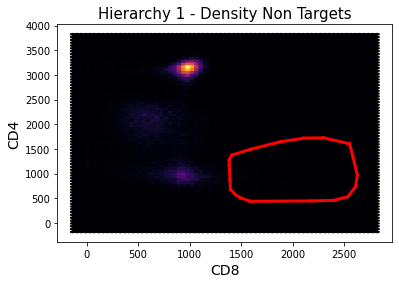

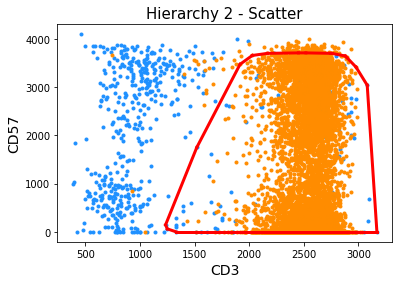

...

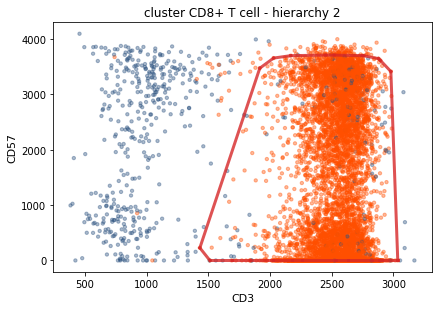

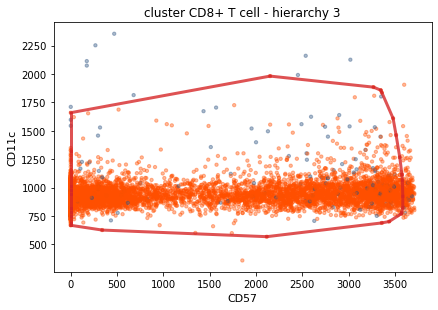

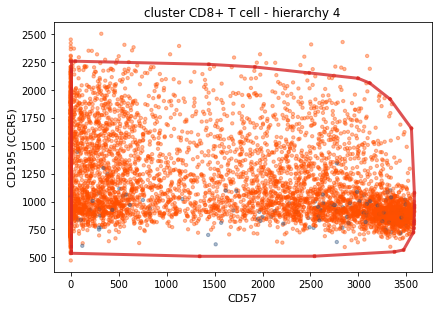

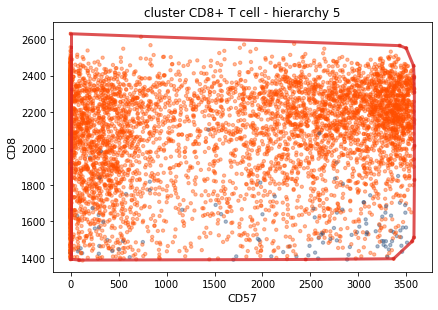

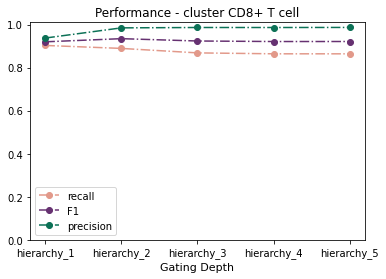

Key cell_type_lvl_2
Group NK T cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4
f1            0.064081     0.330189     0.450331     0.450704
recall        0.345455     0.318182     0.309091     0.290909
precision     0.035316     0.343137     0.829268     1.000000


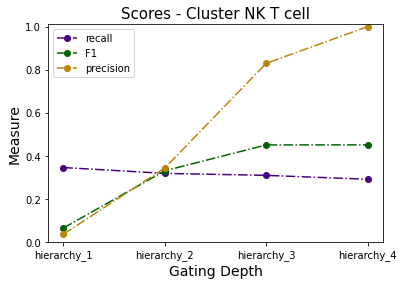

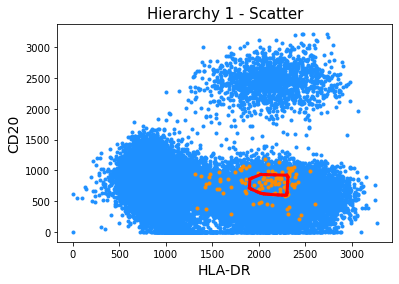

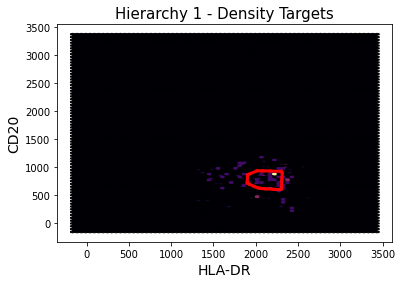

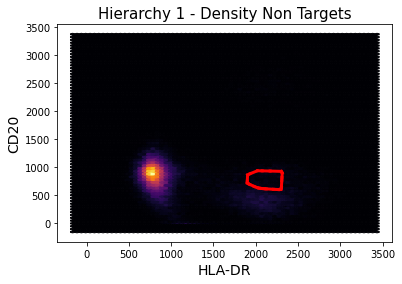

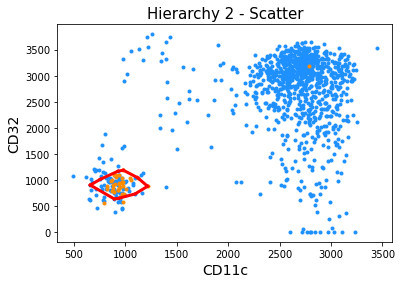

...

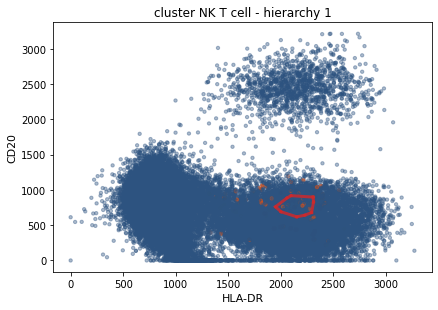

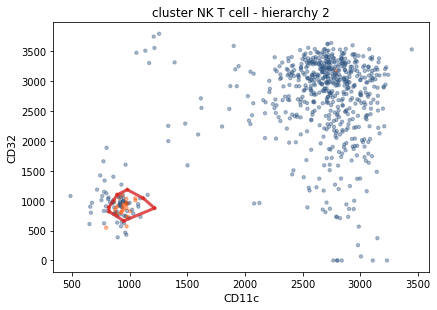

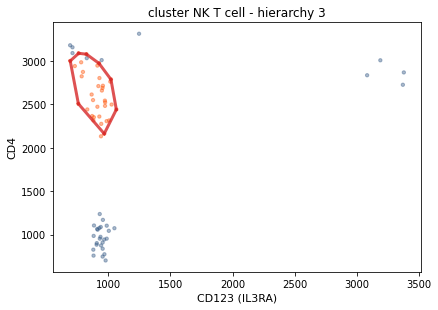

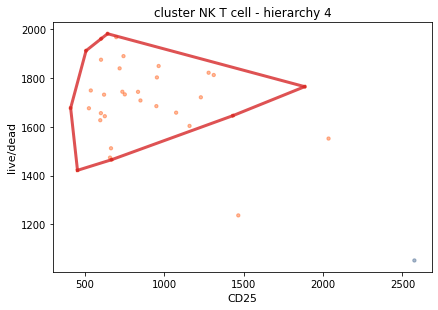

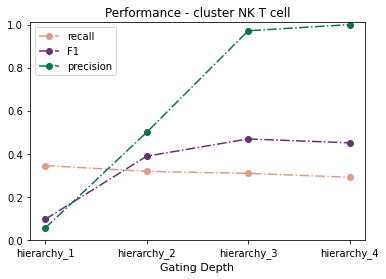

Key cell_type_lvl_2
Group NK cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.742791     0.812691     0.874761     0.866059     0.864666
recall        0.846451     0.780269     0.777640     0.763878     0.761713
precision     0.661750     0.847925     0.999602     0.999798     0.999797


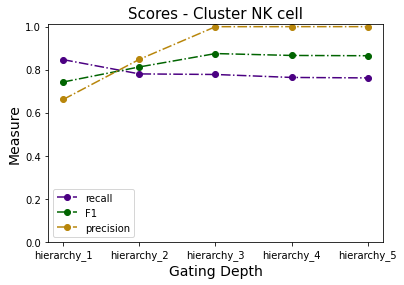

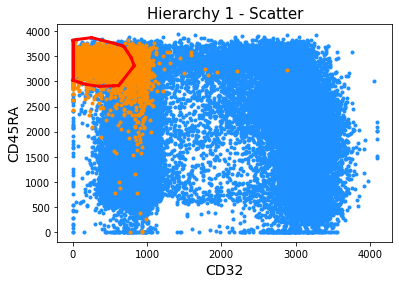

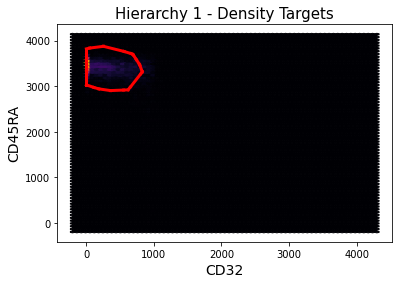

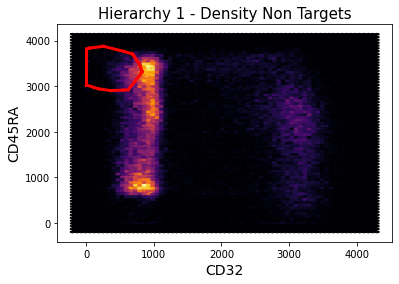

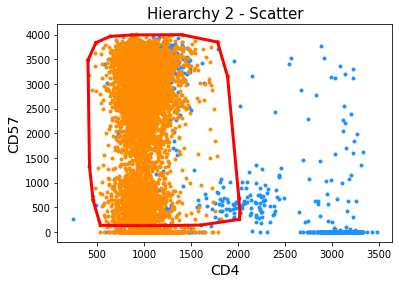

...

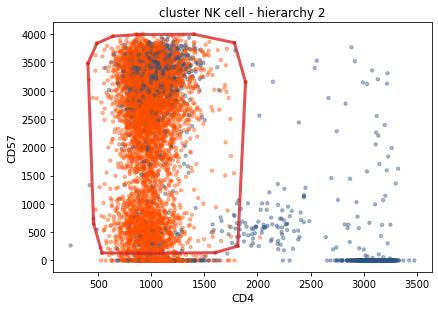

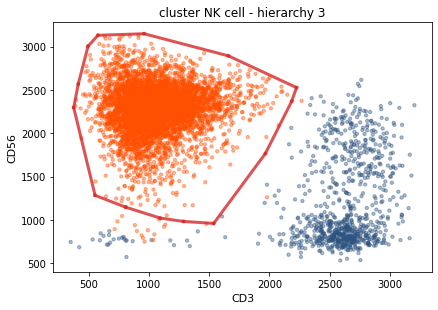

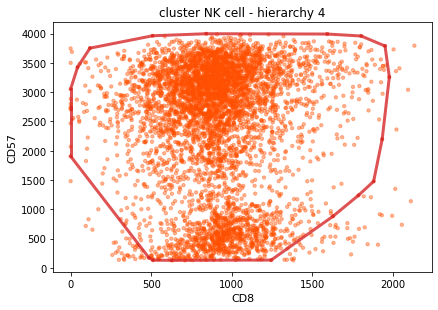

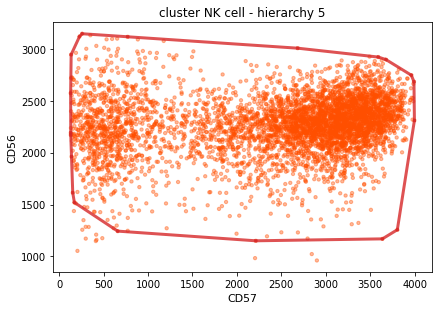

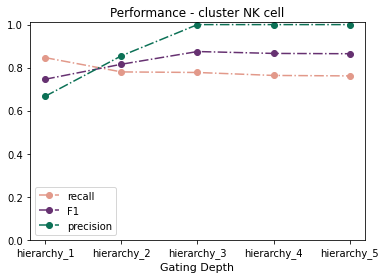

Key cell_type_lvl_2
Group T cell
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.221446     0.330047     0.435814     0.395975     0.416965
recall        0.511589     0.394868     0.387831     0.301325     0.288907
precision     0.141306     0.283507     0.497346     0.577320     0.748927


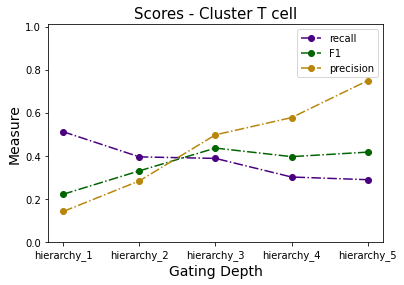

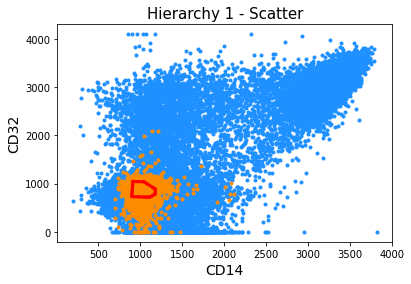

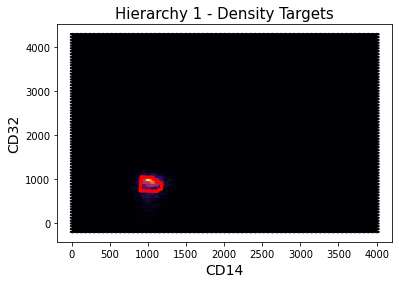

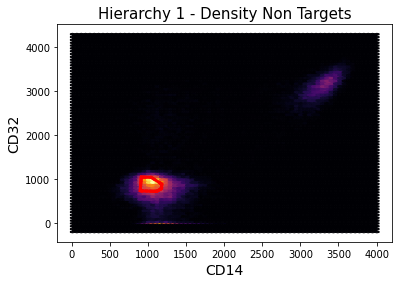

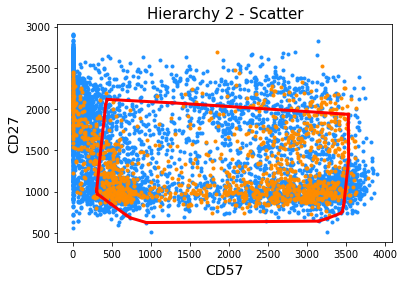

...

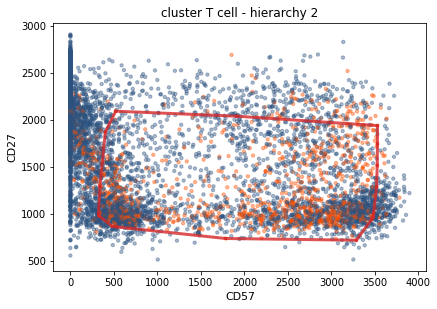

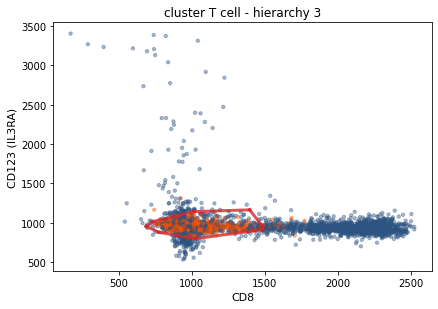

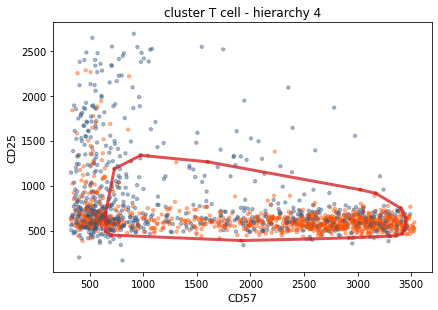

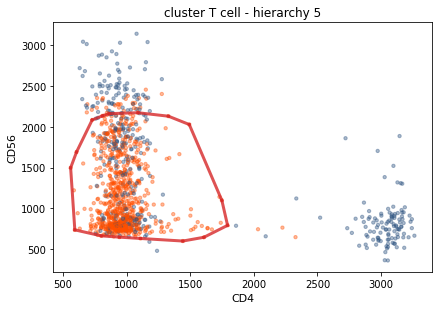

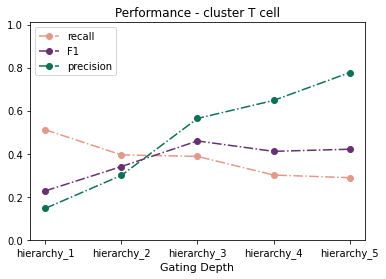

Key cell_type_lvl_2
Group Classical monocyte
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.962933     0.978997     0.978927     0.978769     0.978560
recall        0.986223     0.979896     0.978977     0.978569     0.978161
precision     0.940718     0.978099     0.978878     0.978969     0.978960


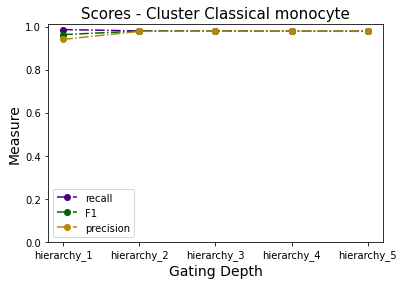

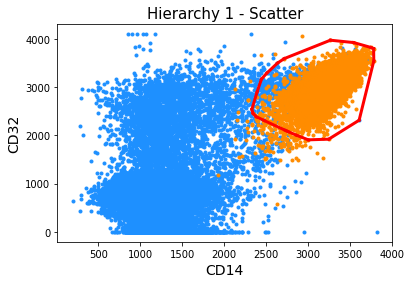

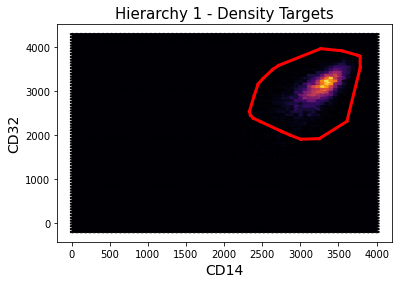

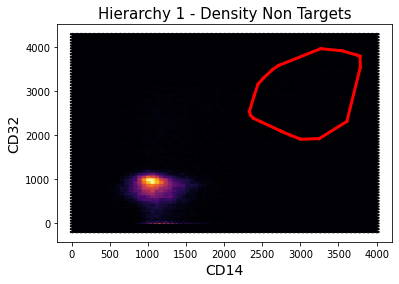

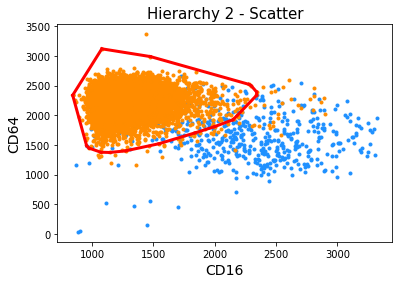

...

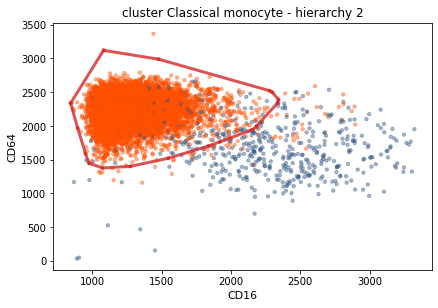

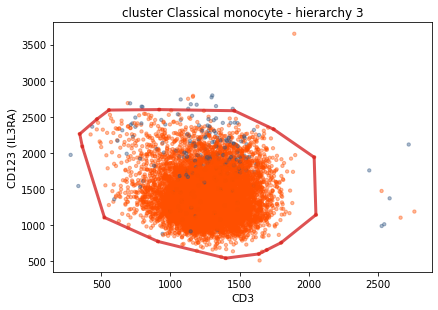

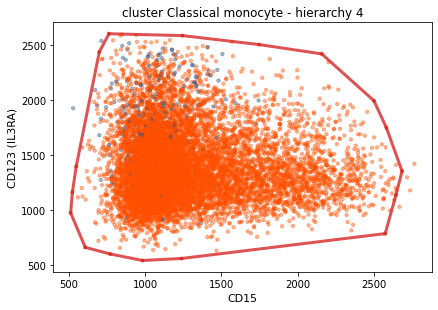

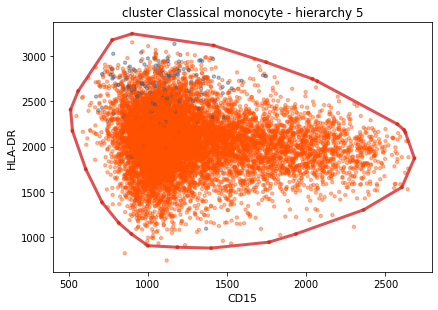

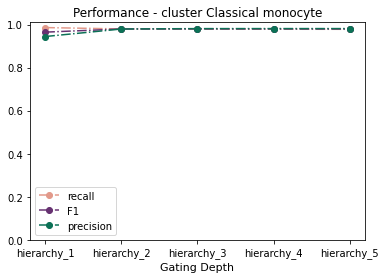

Key cell_type_lvl_2
Group Non-classical monocyte
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.480892     0.800490     0.808173     0.790521     0.792180
recall        0.729827     0.706772     0.698127     0.672911     0.671470
precision     0.358584     0.922860     0.959406     0.957949     0.965803


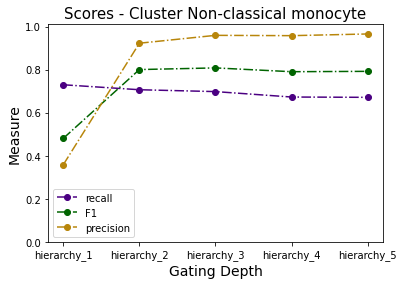

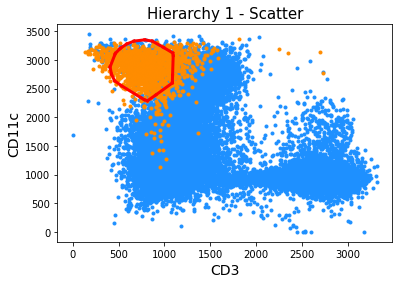

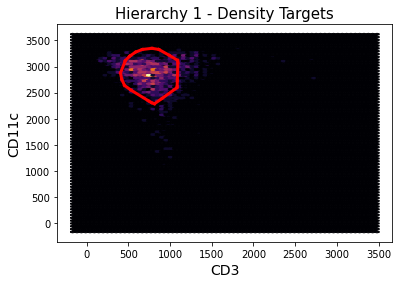

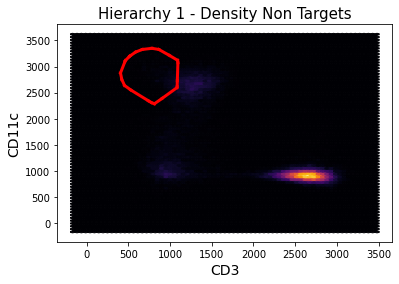

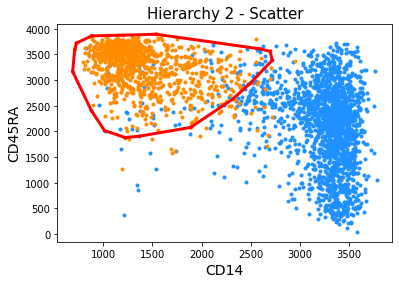

...

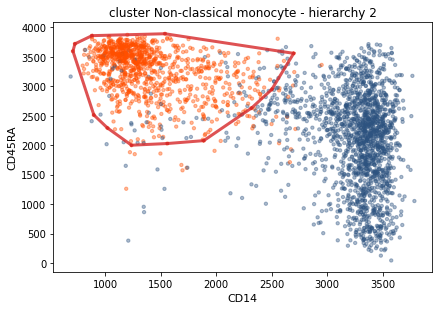

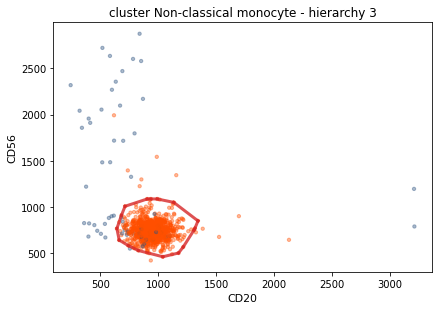

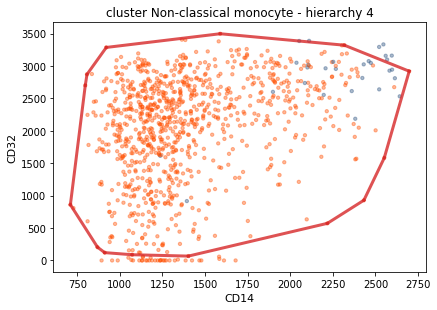

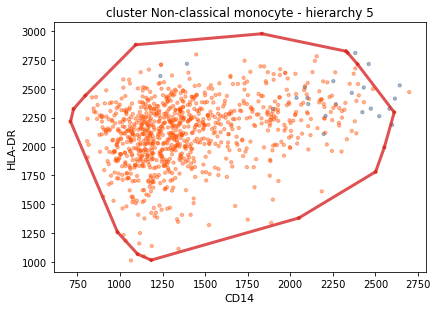

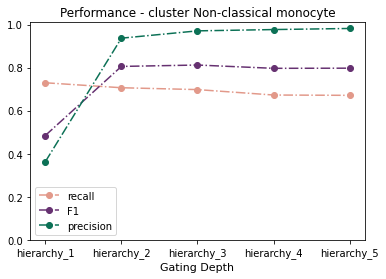

Key cell_type_lvl_2
Group Intermediate monocyte
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.379435     0.503145     0.497309     0.500000     0.468997
recall        0.454861     0.416667     0.401042     0.394097     0.361111
precision     0.325466     0.634921     0.654391     0.683735     0.668810


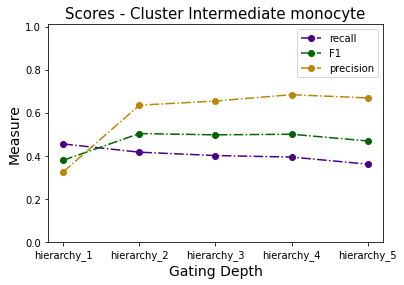

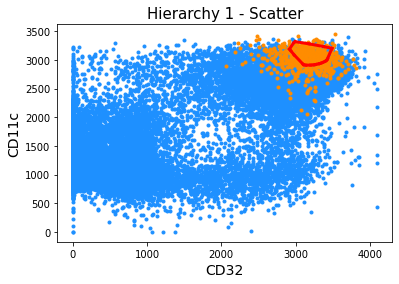

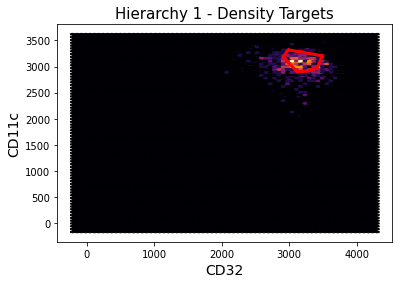

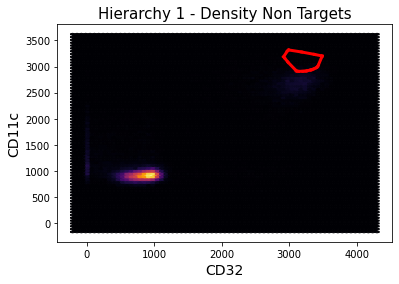

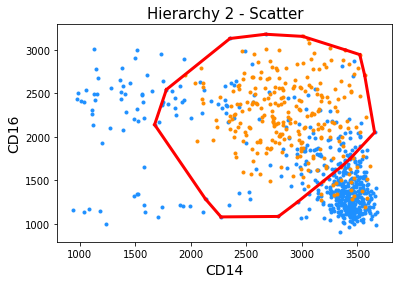

...

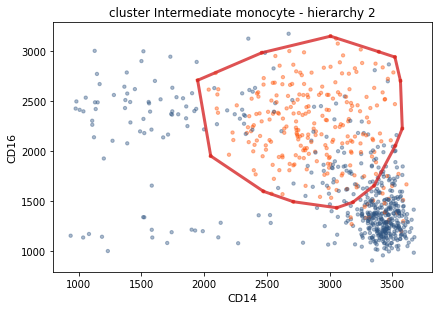

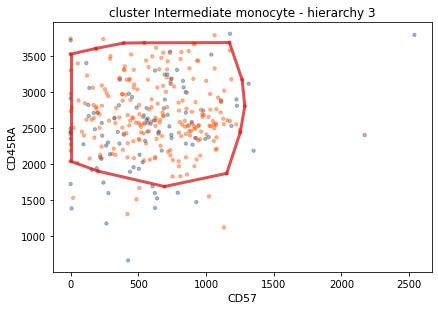

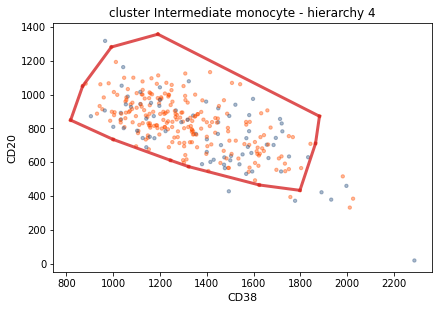

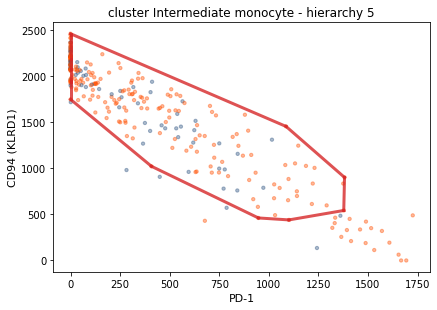

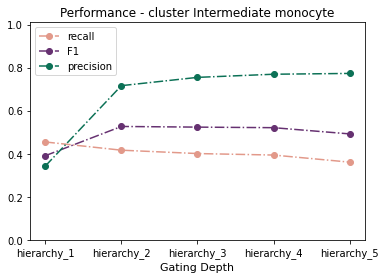

Key cell_type_lvl_2
Group cDC
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4
f1            0.285963     0.607143     0.635081     0.627171
recall        0.489583     0.480655     0.468750     0.456845
precision     0.201964     0.823980     0.984375     1.000000


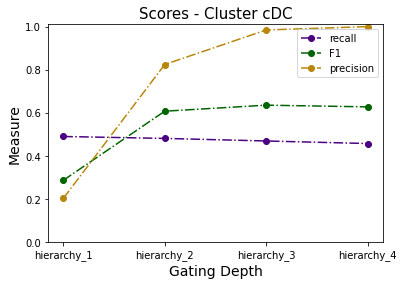

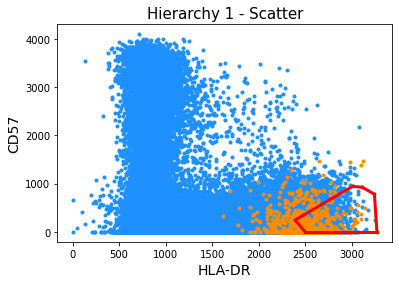

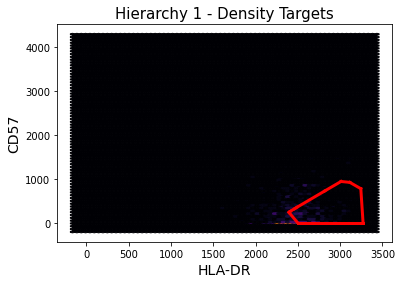

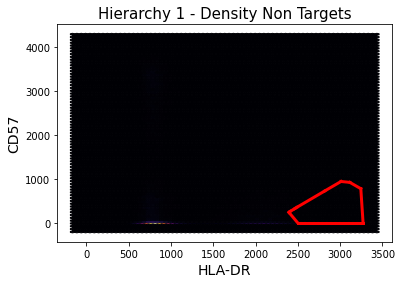

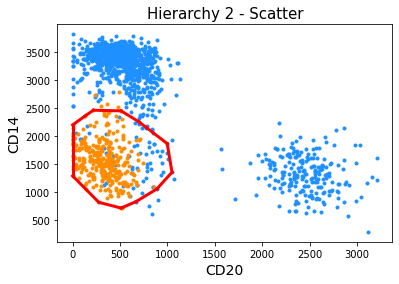

...

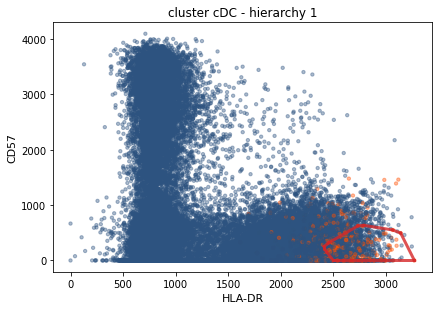

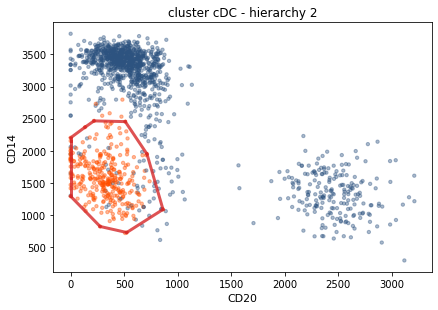

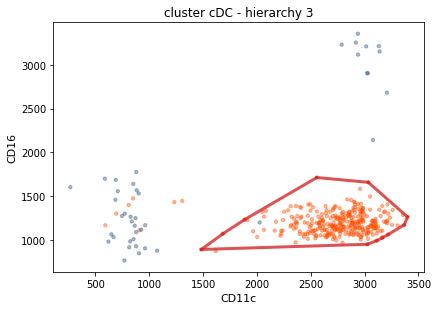

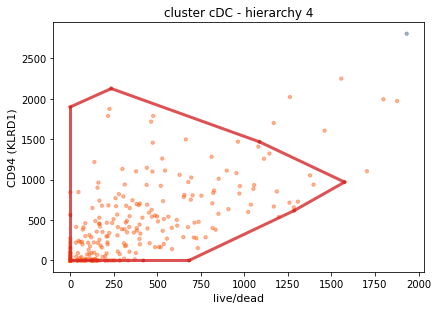

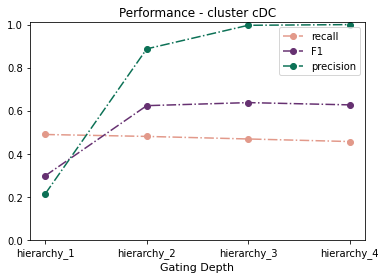

Key cell_type_lvl_2
Group pDC
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.678967     0.728745     0.726531     0.721311     0.721311
recall        0.593548     0.580645     0.574194     0.567742     0.567742
precision     0.793103     0.978261     0.988889     0.988764     0.988764


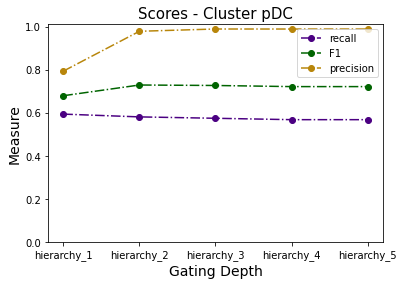

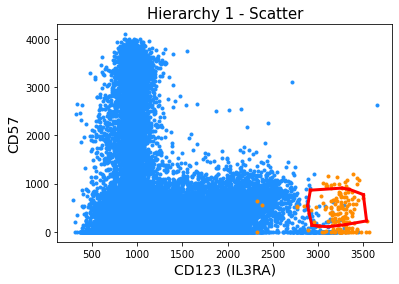

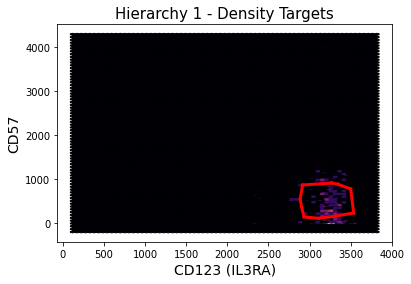

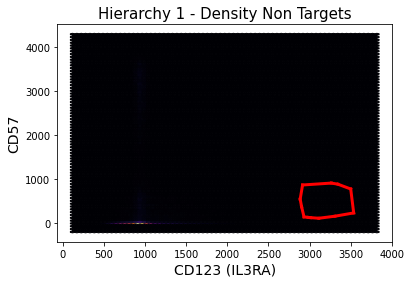

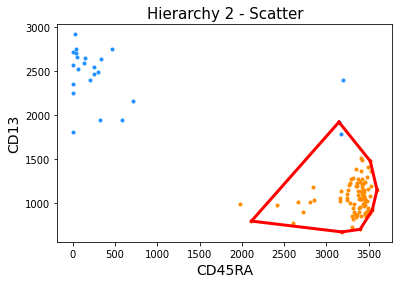

...

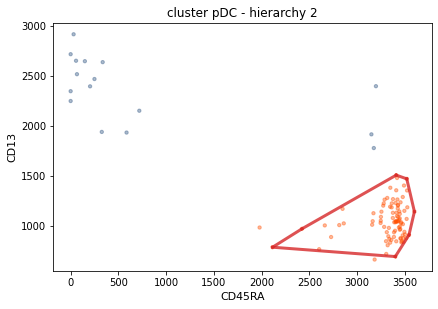

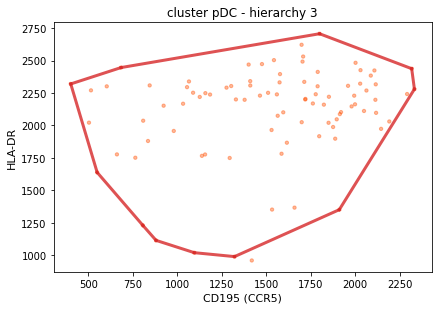

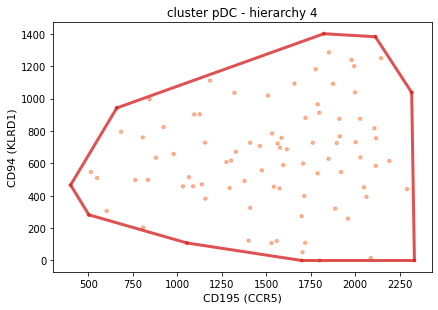

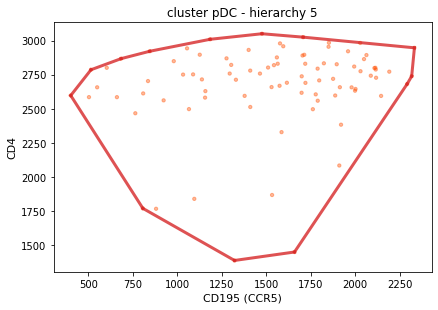

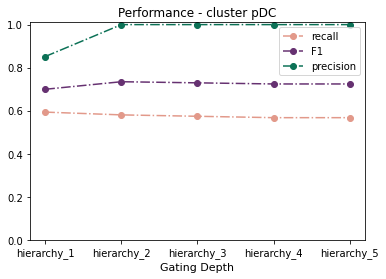

Key cell_type_lvl_2
Group pre-DC
           hierarchy_1  hierarchy_2  hierarchy_3
f1            0.983452     0.983373     0.971014
recall        0.976526     0.971831     0.943662
precision     0.990476     0.995192     1.000000


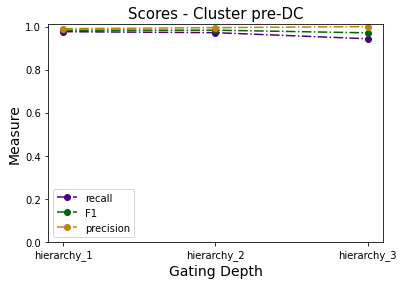

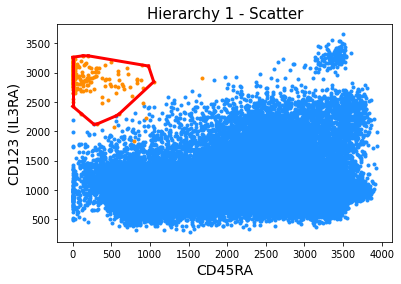

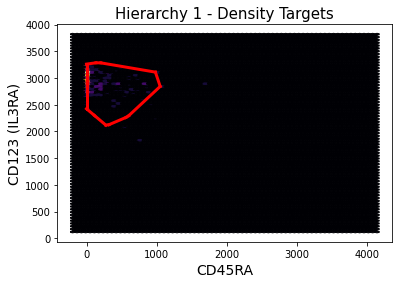

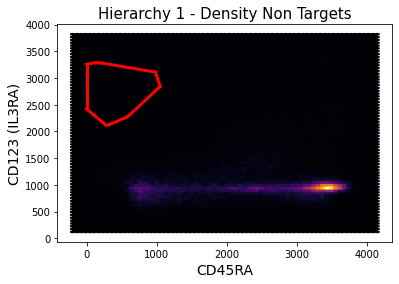

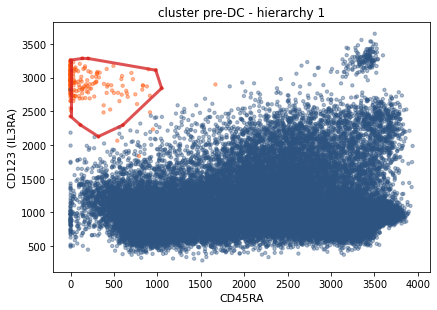

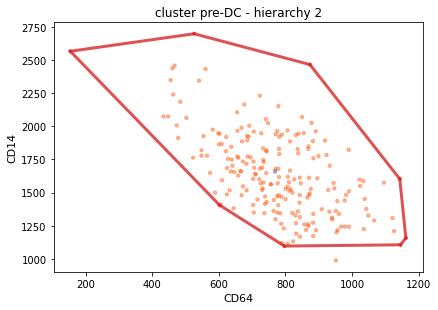

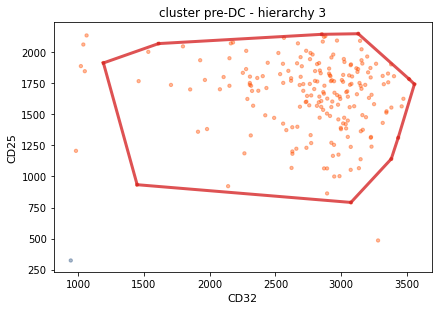

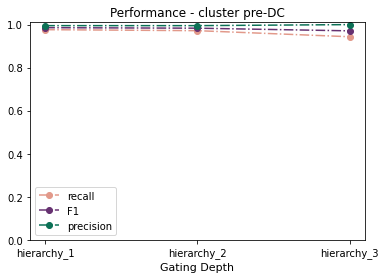

In [17]:
for group in adata.obs[key].cat.categories:
    if group=='not annotated':
        continue

    run_convex_gating(data = adata_path, 
                      key = key,
                      group = group,
                      batch = None,
                      subsample = subsample,
                      save_path = save_path,
                      verbose = verbose
                     )

Run for two individual cell populations. Here pDCs and cDCs.

Key cluster cell_type_lvl_2
Group cDC
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.261126     0.676208     0.710900     0.713043     0.705653
recall        0.601810     0.570136     0.565611     0.556561     0.546003
precision     0.166736     0.830769     0.956633     0.991935     0.997245


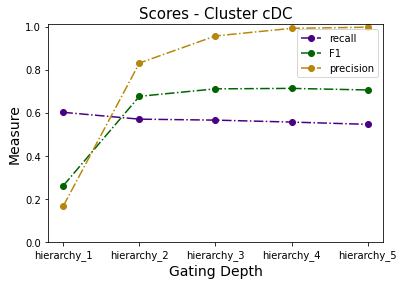

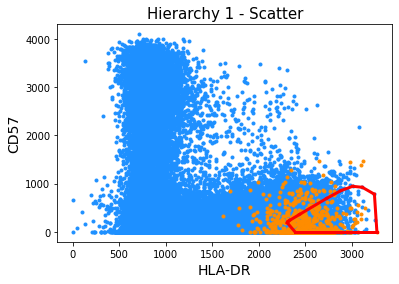

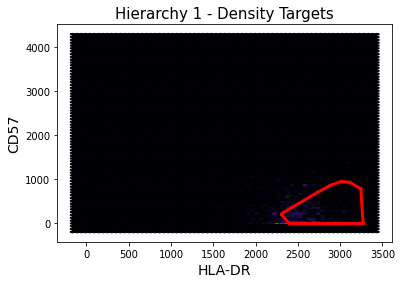

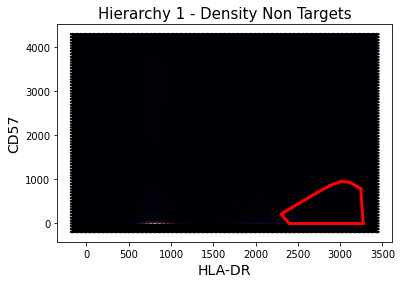

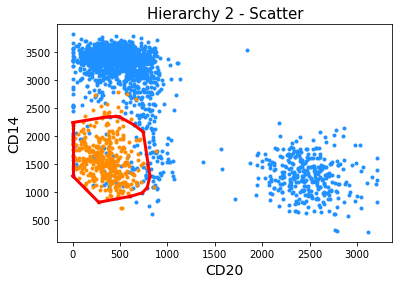

...

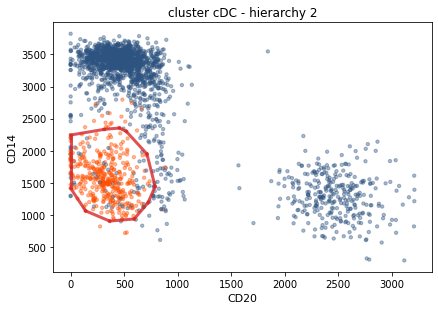

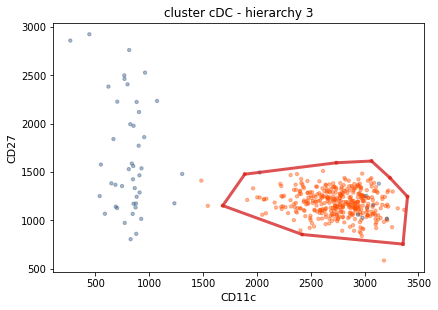

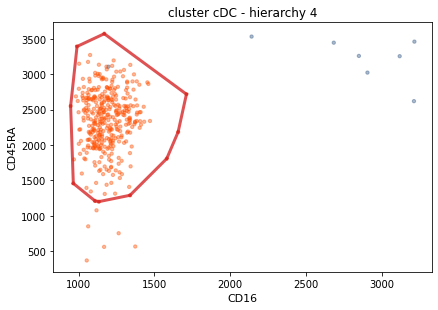

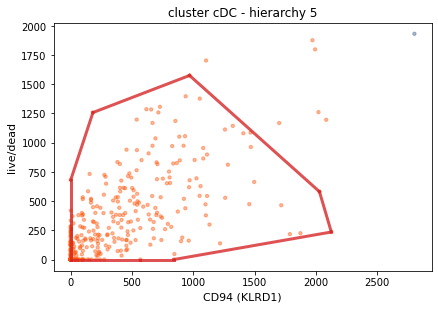

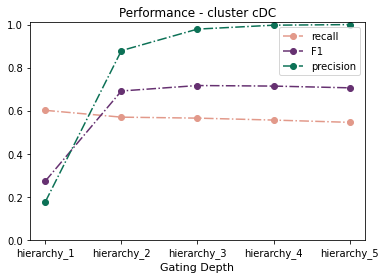

Key cluster cell_type_lvl_2
Group pDC
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.696864     0.748092     0.733591     0.728682     0.728682
recall        0.613497     0.601227     0.582822     0.576687     0.576687
precision     0.806452     0.989899     0.989583     0.989474     0.989474


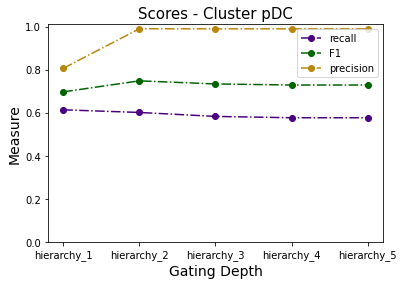

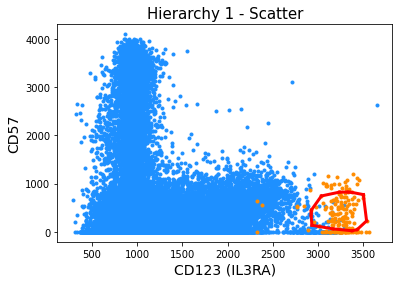

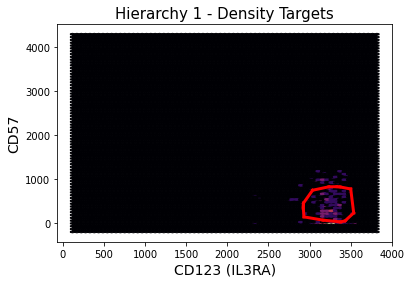

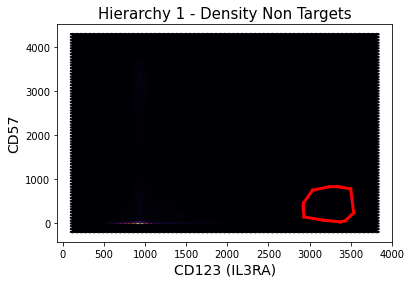

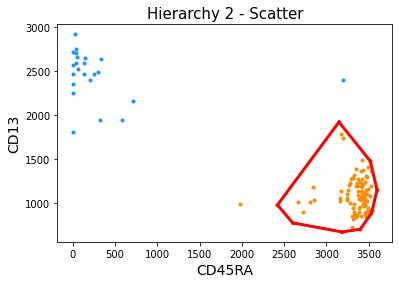

...

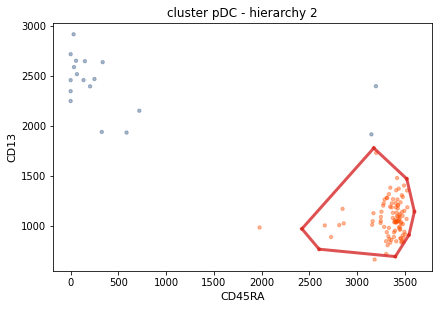

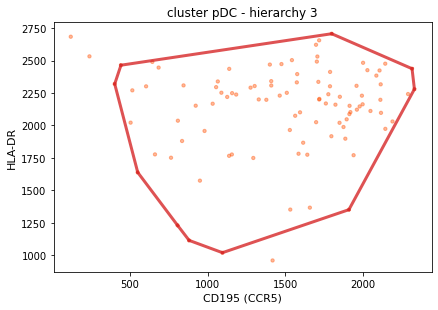

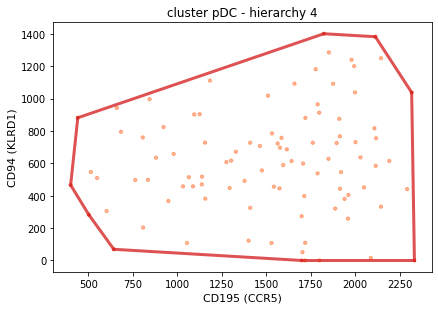

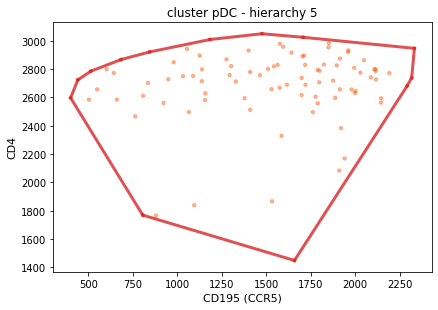

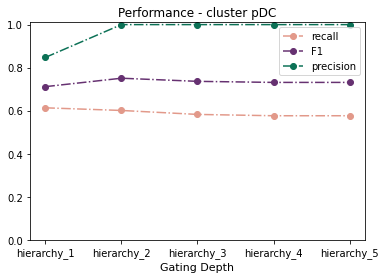

In [17]:
for group in ['cDC', 'pDC']:
    if group=='not annotated':
        continue

    run_convex_gating(data = adata_path, 
                      key = key,
                      group = group,
                      batch = None,
                      subsample = subsample,
                      save_path = save_path,
                      verbose = verbose
                     )

Load metadata for cell type level 2.

In [18]:
metadata2 = {}
for group in adata.obs[key].cat.categories:
    if (group=='not annotated') | (group=='NK T cell'):
        continue
    metadata2[group] = np.load(os.path.join(save_path, 'cluster_'+group, 'meta_info.npy'), allow_pickle=True).item()
        

## Compute final performance per sample

Here we re-load the individual performance results per cell and compute precision, recall and F1 score per sample.

In [51]:
metadata['B cell']['general_summary'][0].iloc[:5,25:]

,CD56,HLA-DR,true_label,gate_1,gate_2,gate_3,gate_4,gate_5,new_gate_1,new_gate_2,new_gate_3,new_gate_4,new_gate_5,final_gate_0,final_gate_1,final_gate_2,final_gate_3,final_gate_4,final_gate_5,sample
0,894.476313,1949.269908,0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,1.0,0,0,0,0,0,NL01
1,695.740803,2470.334494,0,0.0,0.0,0.0,0.0,0.0,0,1,0,1,0,1.0,0,0,0,0,0,NL09
2,1241.237341,813.311162,0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,1,1.0,0,0,0,0,0,NL05
3,1181.138165,817.151653,0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,1,1.0,0,0,0,0,0,NL09
4,794.652330,2274.799539,1,1.0,1.0,1.0,1.0,1.0,1,1,1,1,1,1.0,1,1,1,1,1,NL05


In [19]:
gate_metadata = {}
for key in metadata.keys():
    select_columns = metadata[key]['general_summary'][0].columns[metadata[key]['general_summary'][0].columns.str.count('final_gate_')>0][1:]
    gate_metadata[key] = metadata[key]['general_summary'][0][select_columns]
    gate_metadata[key]['true_label'] =  metadata[key]['general_summary'][0]['true_label']
    gate_metadata[key]['sample'] =  metadata[key]['general_summary']['sample']

In [20]:
gate_metadata2 = {}
for key in metadata2.keys():
    select_columns = metadata2[key]['general_summary'][0].columns[metadata2[key]['general_summary'][0].columns.str.count('final_gate_')>0][1:]
    gate_metadata2[key] = metadata2[key]['general_summary'][0][select_columns]
    gate_metadata2[key]['true_label'] =  metadata2[key]['general_summary'][0]['true_label']
    gate_metadata2[key]['sample'] =  metadata2[key]['general_summary']['sample']

In [23]:
gate_metadata['B cell']

,final_gate_1,final_gate_2,final_gate_3,final_gate_4,final_gate_5,true_label,sample
0,0,0,0,0,0,0,NL01
1,0,0,0,0,0,0,NL09
2,0,0,0,0,0,0,NL05
3,0,0,0,0,0,0,NL09
4,1,1,1,1,1,1,NL05
...,...,...,...,...,...,...,...
49995,0,0,0,0,0,0,NL01
49996,0,0,0,0,0,0,NL09
49997,0,0,0,0,0,0,NL01
49998,0,0,0,0,0,0,NL01


In [21]:
from sklearn.metrics import precision_recall_fscore_support

In [22]:
precision, recall, fscore, _ = precision_recall_fscore_support(y_true=gate_metadata['B cell']['true_label'],
                                y_pred=gate_metadata['B cell']['final_gate_1'])

In [26]:
key = 'cell_type_level_1'
res_list = []
for cell_type in gate_metadata.keys():
    hierarchies = gate_metadata[cell_type].columns[gate_metadata[cell_type].columns.str.count('final_gate_')>0]
    for gate_no in hierarchies:

#cell_type = 'B cell'
#gate_no = 'final_gate_1'

        result = gate_metadata[cell_type].groupby('sample')[['true_label', 
                               gate_no]].apply(lambda s: precision_recall_fscore_support(
                   y_true=s['true_label'],  y_pred=s[gate_no]))
        result_df = result.apply(lambda x: 
                         (x[0][1], x[1][1], x[2][1])).apply(pd.Series, 
                                                            index=['precision', 'recall', 'f1score'])
        result_df=result_df.unstack().reset_index().rename(columns={'level_0': 'metric', 0 : 'value'})
        result_df['cell_type_level'] = key
        result_df['cell_type'] = cell_type
        result_df['hierarchy'] = gate_no
        res_list.append(result_df)

In [27]:
key = 'cell_type_level_2'
#res_list = []
for cell_type in gate_metadata2.keys():
    hierarchies = gate_metadata2[cell_type].columns[gate_metadata2[cell_type].columns.str.count('final_gate_')>0]
    for gate_no in hierarchies:

#cell_type = 'B cell'
#gate_no = 'final_gate_1'

        result = gate_metadata2[cell_type].groupby('sample')[['true_label', 
                               gate_no]].apply(lambda s: precision_recall_fscore_support(
                   y_true=s['true_label'],  y_pred=s[gate_no]))
        result_df = result.apply(lambda x: 
                         (x[0][1], x[1][1], x[2][1])).apply(pd.Series, 
                                                            index=['precision', 'recall', 'f1score'])
        result_df = result_df.unstack().reset_index().rename(columns={'level_0': 'metric', 0 : 'value'})
        result_df['cell_type_level'] = key
        result_df['cell_type'] = cell_type
        result_df['hierarchy'] = gate_no
        res_list.append(result_df)

Save all results to file.

In [28]:
performance_per_sample = pd.concat(res_list)

In [29]:
performance_per_sample.to_csv('../data/Convex_gating_test_MB/cg_lvl1/cg_performance_per_sample_rev.csv')

In [30]:
performance_per_sample.head()

,metric,sample,value,cell_type_level,cell_type,hierarchy
0,precision,NL01,0.944162,cell_type_level_1,B cell,final_gate_1
1,precision,NL03,0.972665,cell_type_level_1,B cell,final_gate_1
2,precision,NL05,0.983582,cell_type_level_1,B cell,final_gate_1
3,precision,NL07,0.962264,cell_type_level_1,B cell,final_gate_1
4,precision,NL09,0.972222,cell_type_level_1,B cell,final_gate_1


## Plot performance of last hierarchy per cell type

In [31]:
import seaborn as sns

In [32]:
performance_ct1_final = performance_per_sample.loc[
    (performance_per_sample['cell_type_level']=='cell_type_level_1') &  
    (performance_per_sample['hierarchy']=='final_gate_5')]

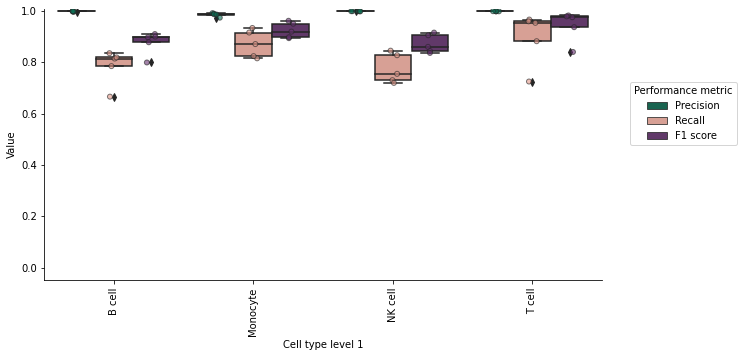

In [33]:
fig = plt.figure(figsize=(10,5))
p7 = sns.boxplot(data =performance_ct1_final, x='cell_type', y='value', 
                 hue='metric', palette=["#0c7156", "#e2998a", "#663171"] #palette='Dark2', 
                )
sns.stripplot(ax=p7,data =performance_ct1_final, x='cell_type', y='value', 
                 hue='metric',
               palette=["#0c7156", "#e2998a", "#663171"],
              #palette='tab20',
              size=5, dodge=True, linewidth=1, alpha=0.6)

handles, labels = p7.get_legend_handles_labels()
p7.legend(handles = handles[:3],labels = ['Precision', 'Recall', 'F1 score'],
          bbox_to_anchor=(1.25,0.75), 
          title='Performance metric')

p7.set_xlabel('Cell type level 1')
p7.set_ylabel('Value')
p7.set_xticklabels(p7.get_xticklabels(), rotation=90)
p7.set_ylim([-0.05, 1.01])
p7.spines['top'].set_visible(False)
p7.spines['right'].set_visible(False)
plt.savefig(f'./../figures/{today}_performance_cg_largePBMC_ct1.pdf', bbox_inches='tight')
plt.savefig(f'./../figures/{today}_performance_cg_largePBMC_ct1.png', bbox_inches='tight')
plt.show()

In [34]:
performance_ct2_final = performance_per_sample.loc[
    (performance_per_sample['cell_type_level']=='cell_type_level_2') & 
    (performance_per_sample['hierarchy'].isin(['final_gate_3', 'final_gate_4','final_gate_5' ])) ]

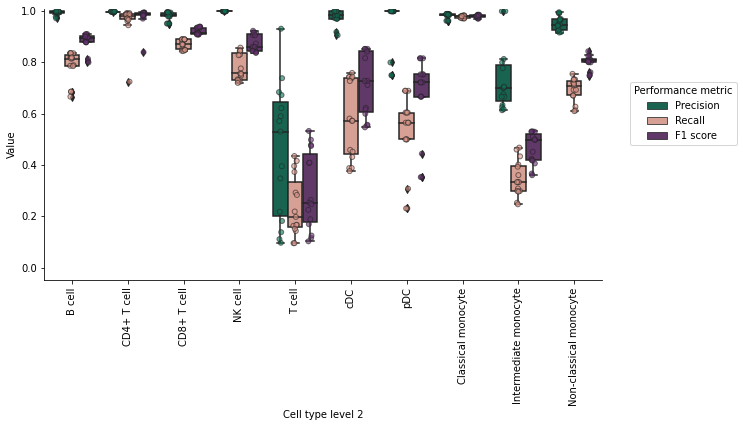

In [37]:
fig = plt.figure(figsize=(10,5))
p7 = sns.boxplot(data =performance_ct2_final, x='cell_type', y='value', 
                 hue='metric', palette=["#0c7156", "#e2998a", "#663171"] #palette='Dark2', 
                )
sns.stripplot(ax=p7,data =performance_ct2_final, x='cell_type', y='value', 
                 hue='metric',
               palette=["#0c7156", "#e2998a", "#663171"],
              #palette='tab20',
              size=5, dodge=True, linewidth=1, alpha=0.6)
#sns.stripplot(ax=p7,data =gold, x='cell type label level 1', y='composition', hue='sample',
#              color='grey',
              #palette='tab20',
#              size=10, dodge=True, marker='D', linewidth=1, alpha=0.6)
handles, labels = p7.get_legend_handles_labels()
p7.legend(handles = handles[:3],labels = ['Precision', 'Recall', 'F1 score'],
          bbox_to_anchor=(1.25,0.75), 
          title='Performance metric')

p7.set_xlabel('Cell type level 2')
p7.set_ylabel('Value')
p7.set_xticklabels(p7.get_xticklabels(), rotation=90)
p7.set_ylim([-0.05, 1.01])
p7.spines['top'].set_visible(False)
p7.spines['right'].set_visible(False)
plt.savefig(f'./../figures/{today}_performance_cg_largePBMC_ct2.pdf', bbox_inches='tight')
plt.savefig(f'./../figures/{today}_performance_cg_largePBMC_ct2.png', bbox_inches='tight')
plt.show()

## Explore performance and marker choice for pDCs

When we infer a gating strategy for pDCs, we observe that the first hierarchy selects CD123 positive and CD57 negative to separate pDCs from all other cells, and CD45RA positive events only in the second hierarchy. The question is whether CD57 is actually necessary for the separation. Here we test if we achieve similar performance for pDCs without CD57 as marker.  

In [12]:
save_path = './../data/Convex_gating_test_MB/cg_lvl2_pDC_test/'
key = 'cluster cell_type_lvl_2'
subsample = 50000
verbose=True
adata_path='./../data/Convex_gating_test_MB/anndata/HIV_data_annotated_final.h5ad'

Let us select the pDC population and exclude the CD57 marker in our performance test. 

In [13]:
channels = adata.var.index

In [14]:
channels

Index(['CD32', 'CD16', 'CD19', 'IgD', 'CD4', 'CD64', 'CD14', 'CD57', 'CD3',
       'live/dead', 'PD-1', 'CD15', 'CD27', 'CD20', 'CD197 (CCR7)', 'CD45RA',
       'CD94 (KLRD1)', 'CD195 (CCR5)', 'CD8', 'CD38', 'CD11c', 'CD13',
       'CD123 (IL3RA)', 'CD25', 'CD127 (IL7RA)', 'CD56', 'HLA-DR'],
      dtype='object')

In [56]:
channels.drop(['CD57', 'CD3', 'live/dead', 'CD4'])

Index(['CD32', 'CD16', 'CD19', 'IgD', 'CD64', 'CD14', 'PD-1', 'CD15', 'CD27',
       'CD20', 'CD197 (CCR7)', 'CD45RA', 'CD94 (KLRD1)', 'CD195 (CCR5)', 'CD8',
       'CD38', 'CD11c', 'CD13', 'CD123 (IL3RA)', 'CD25', 'CD127 (IL7RA)',
       'CD56', 'HLA-DR'],
      dtype='object')

Key cluster cell_type_lvl_2
Group pDC
           hierarchy_1  hierarchy_2
f1            0.869010     0.894915
recall        0.834356     0.809816
precision     0.906667     1.000000


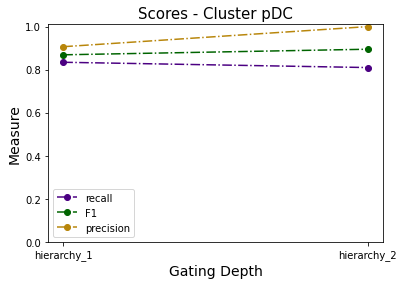

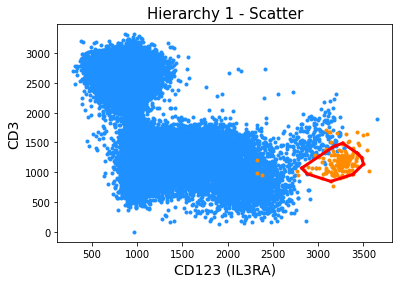

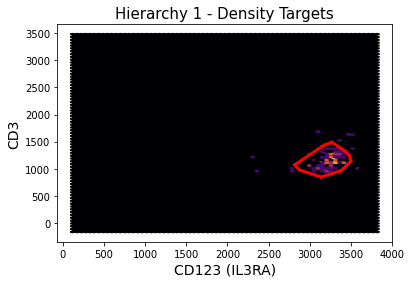

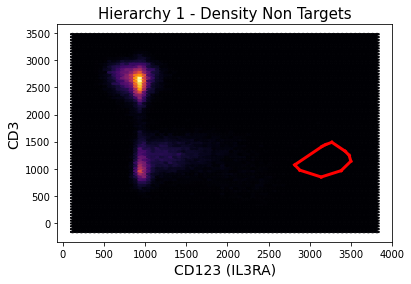

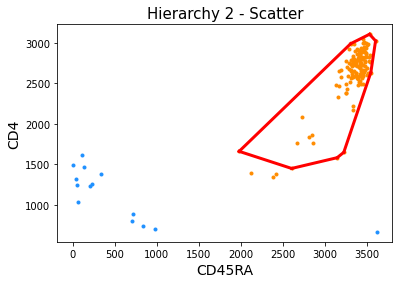

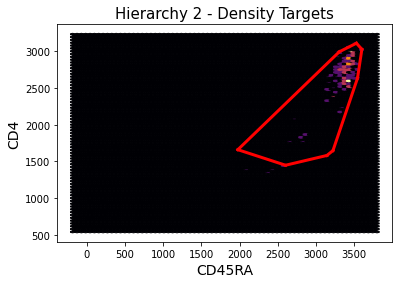

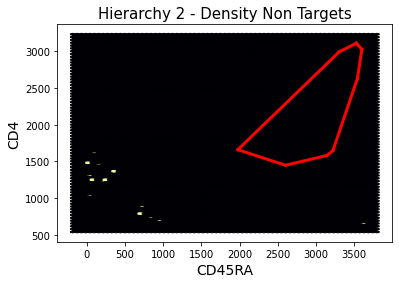

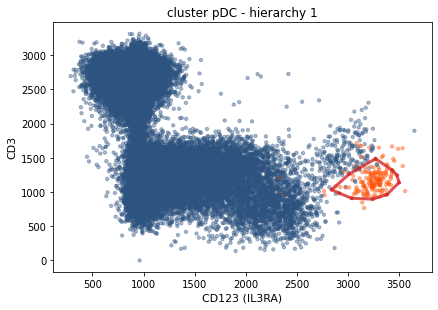

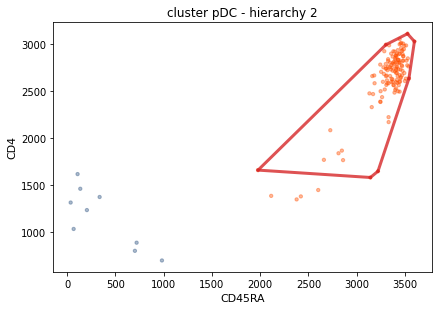

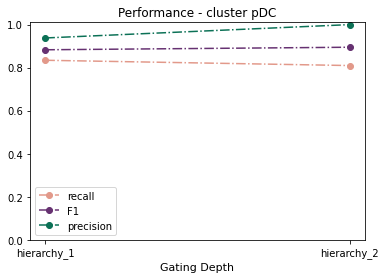

In [69]:
group = 'pDC'
save_path = './../data/Convex_gating_test_MB/cg_lvl2_pDC_test_noCD57/'
run_convex_gating(data = adata_path, 
                  key = key,
                  group = group,
                  batch = None,
                  channels = list(channels.drop(['CD57'])),
                  subsample = subsample,
                  save_path = save_path,
                  verbose = verbose
                 )

Key cluster cell_type_lvl_2
Group pDC
           hierarchy_1  hierarchy_2
f1            0.900000     0.927632
recall        0.883436     0.865031
precision     0.917197     1.000000


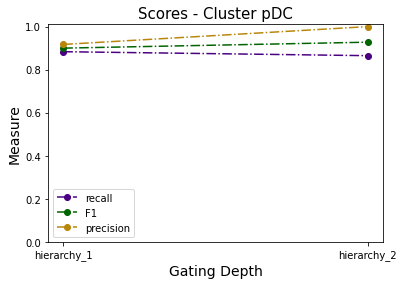

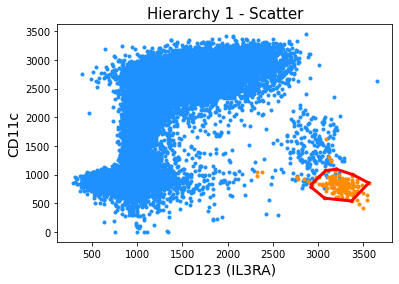

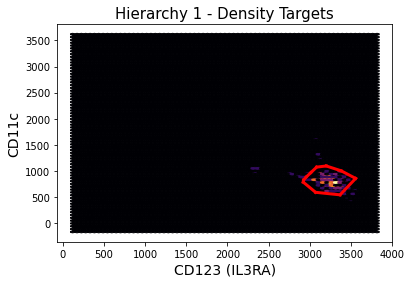

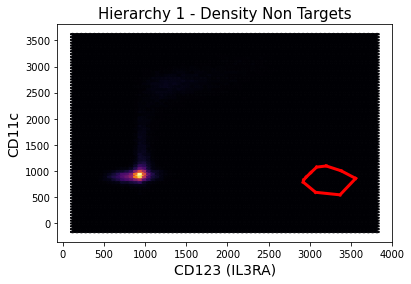

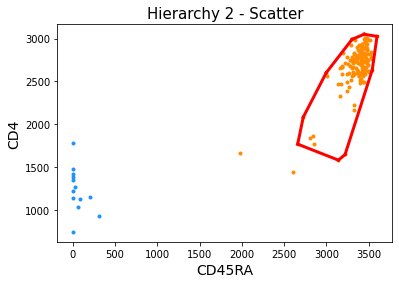

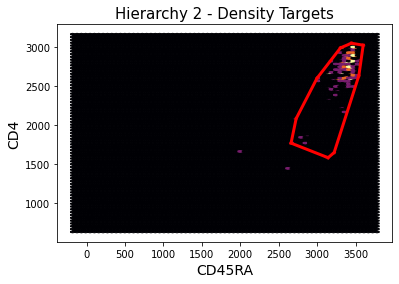

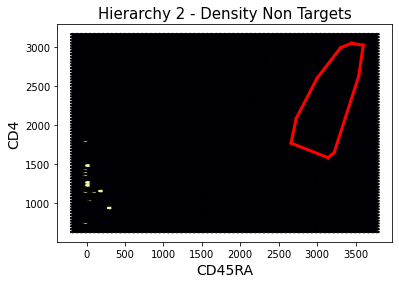

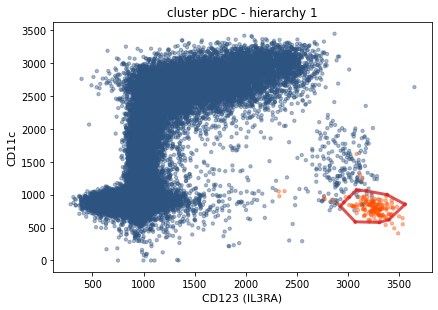

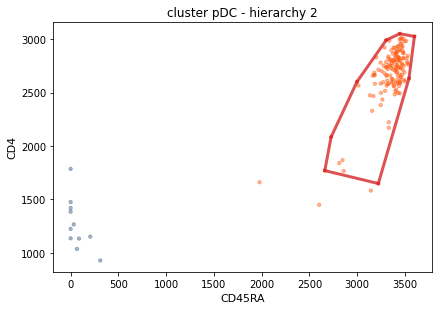

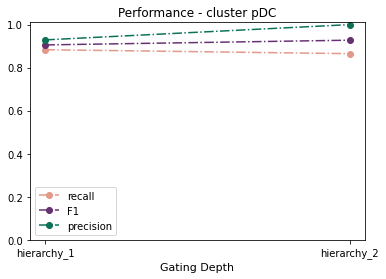

In [70]:
group = 'pDC'
save_path = './../data/Convex_gating_test_MB/cg_lvl2_pDC_test_noCD57CD3/'
run_convex_gating(data = adata_path, 
                  key = key,
                  group = group,
                  batch = None,
                  channels = list(channels.drop(['CD57', 'CD3'])),
                  subsample = subsample,
                  save_path = save_path,
                  verbose = verbose
                 )

Key cluster cell_type_lvl_2
Group pDC
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.946372     0.935065     0.931596     0.924590     0.921053
recall        0.920245     0.883436     0.877301     0.865031     0.858896
precision     0.974026     0.993103     0.993056     0.992958     0.992908


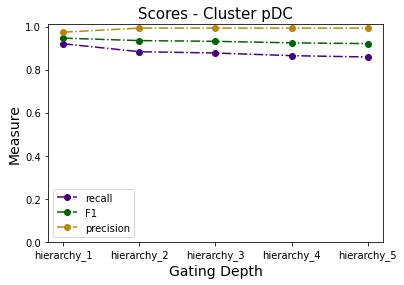

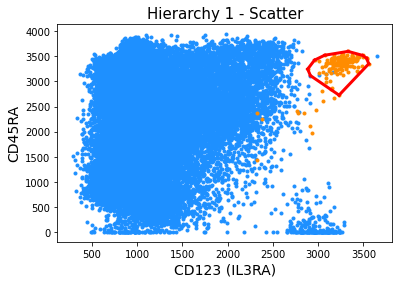

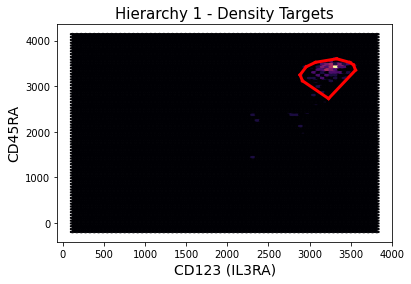

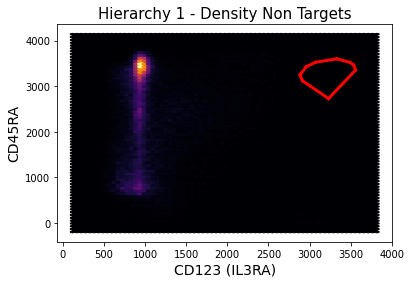

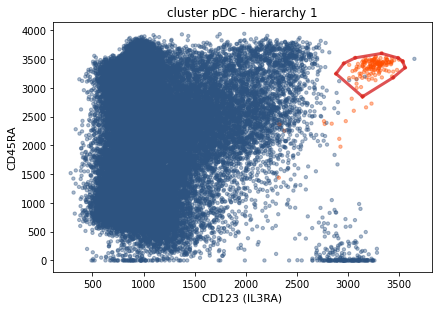

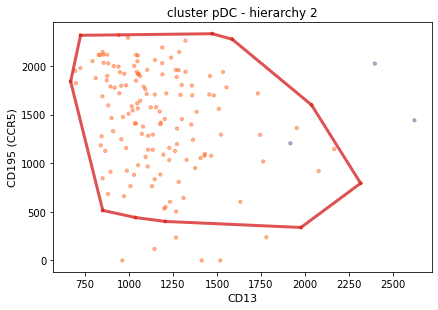

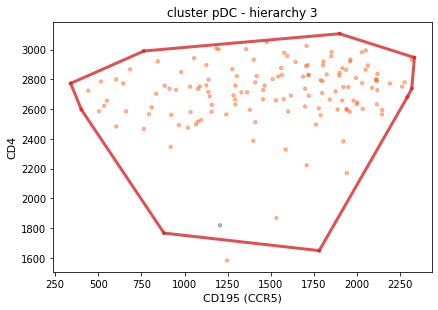

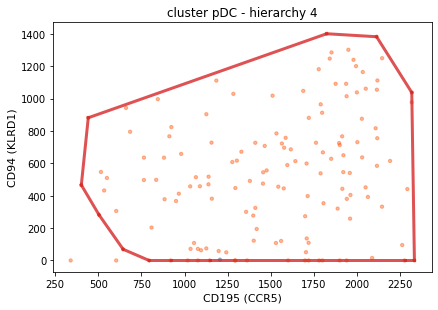

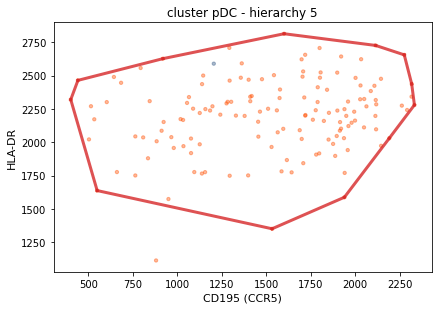

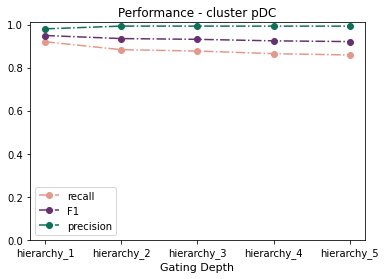

In [73]:
group = 'pDC'
save_path = './../data/Convex_gating_test_MB/cg_lvl2_pDC_test_noCD57CD3CD11c/'
run_convex_gating(data = adata_path, 
                  key = key,
                  group = group,
                  batch = None,
                  channels = list(channels.drop(['CD57', 'CD3', 'CD11c'])),
                  subsample = subsample,
                  save_path = save_path,
                  verbose = verbose
                 )

Key cluster cell_type_lvl_2
Group pDC
           hierarchy_1  hierarchy_2  hierarchy_3  hierarchy_4  hierarchy_5
f1            0.946372     0.935065     0.931596     0.928105     0.921053
recall        0.920245     0.883436     0.877301     0.871166     0.858896
precision     0.974026     0.993103     0.993056     0.993007     0.992908


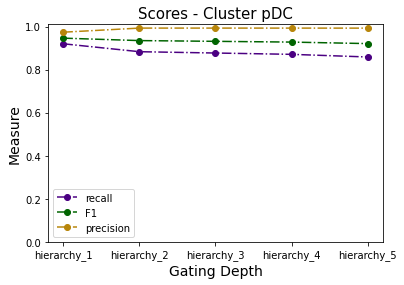

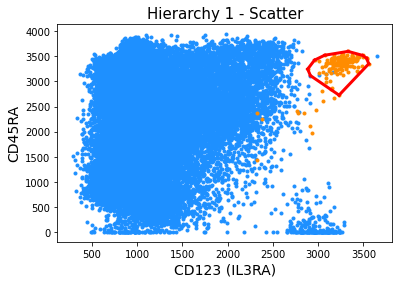

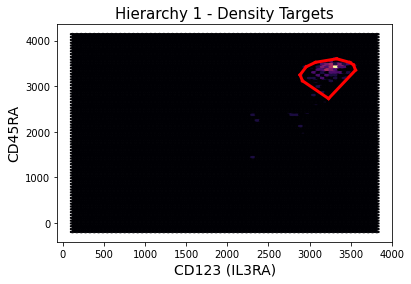

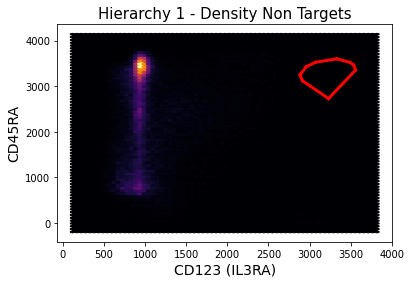

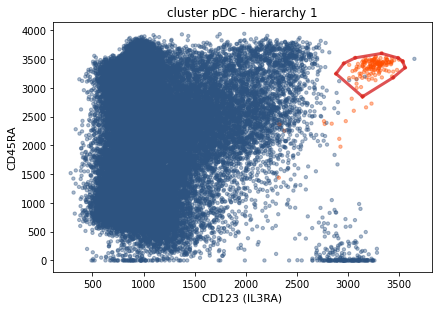

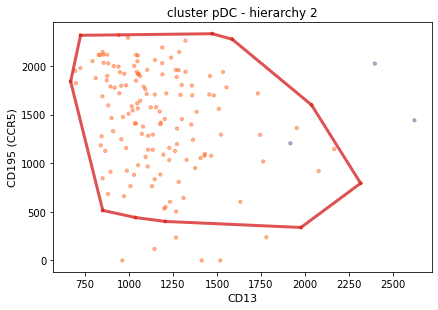

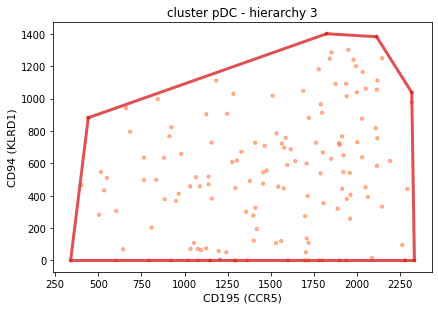

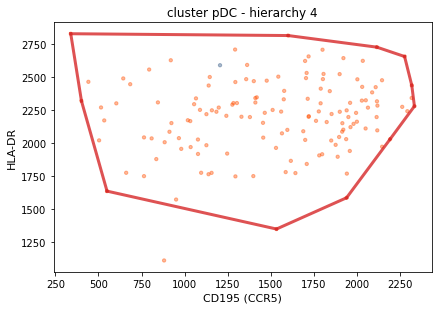

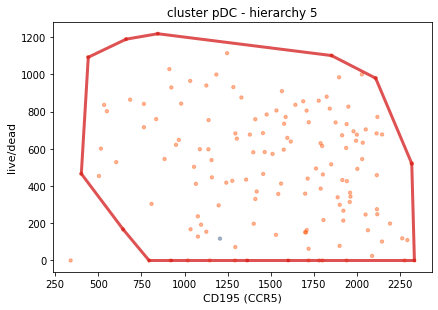

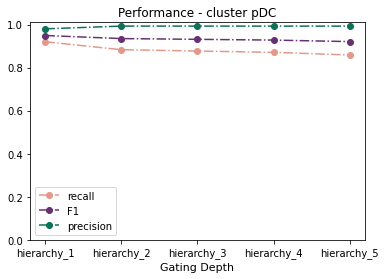

In [71]:
#Test run excluding also CD4, but not relevant for manuscript
group = 'pDC'
save_path = './../data/Convex_gating_test_MB/cg_lvl2_pDC_test_noCD57CD3CD4CD11c/'
run_convex_gating(data = adata_path, 
                  key = key,
                  group = group,
                  batch = None,
                  channels = list(channels.drop(['CD57', 'CD3', 'CD4', 'CD11c'])),
                  subsample = subsample,
                  save_path = save_path,
                  verbose = verbose
                 )

Key cluster cell_type_lvl_2
Group pDC
           hierarchy_1  hierarchy_2
f1            0.900000     0.927632
recall        0.883436     0.865031
precision     0.917197     1.000000


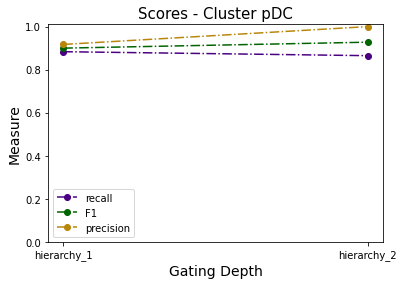

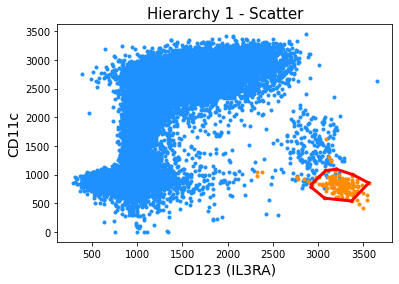

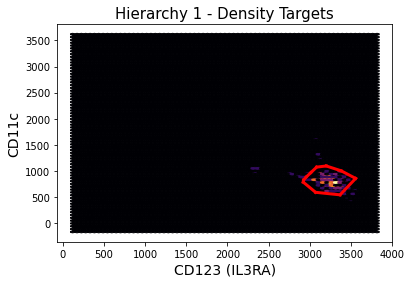

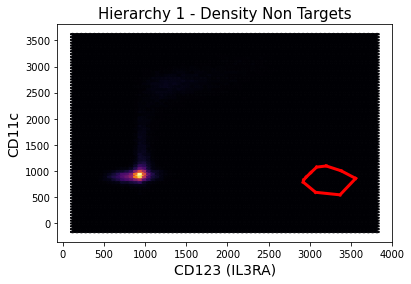

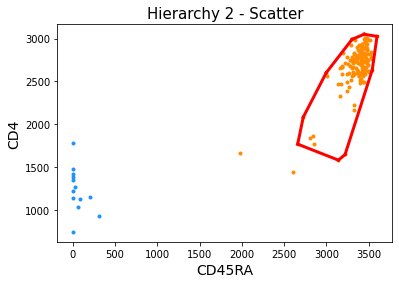

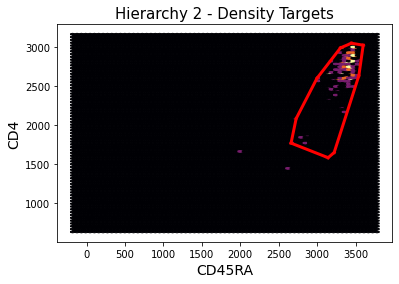

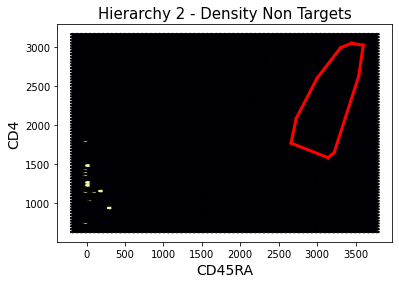

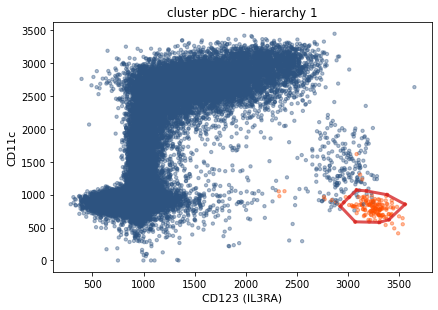

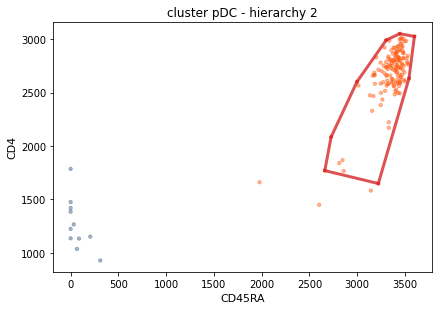

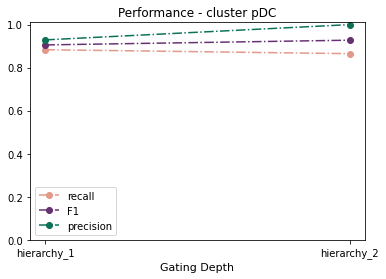

In [72]:
group = 'pDC'
save_path = './../data/Convex_gating_test_MB/cg_lvl2_pDC_test_onlyCD123CD11cCD45RACD4/'

run_convex_gating(data = adata_path, 
                  key = key,
                  group = group,
                  batch = None,
                  channels = list(channels.drop(['CD32',
                                                 'CD16', 'CD19', 'IgD', 
                                                 #'CD4',
                                                 'CD64', 'CD14', 'CD57', 'CD3',
       'live/dead', 'PD-1', 'CD15', 'CD27', 'CD20', 'CD197 (CCR7)', #'CD45RA',
       'CD94 (KLRD1)', 'CD195 (CCR5)', 'CD8', 'CD38', 
                                                 #'CD11c',
                                                 'CD13',
       #'CD123 (IL3RA)', 
                                                 'CD25', 'CD127 (IL7RA)', 'CD56', 'HLA-DR'
                                                ])),
                  subsample = subsample,
                  save_path = save_path,
                  verbose = verbose
                 )

### Postprocess density plots 

In [15]:
data_path = './../data/Convex_gating_test_MB/'
files_all = os.listdir(data_path)
files_params = [fileID for fileID in files_all if fileID.count('_params_')>0]
params = pd.read_csv(data_path + files_params[1], 
                     index_col = 0)
rename_col = [idx.split('parameters.')[-1] for idx in params.columns.values]
params.columns = rename_col
#use only area params
params = params.loc[[channel.endswith('-A') for channel in params.index]]
#rename index using the adata.var['channel'] info
tmp_var = adata.var
#adata.var['channel_tmp'] = [channel.replace('/', '_') for channel in tmp_var.channel]
channel_renames = dict(zip(tmp_var['channel_tmp'].values, 
                           tmp_var['marker'].values))
params.index = params.index.map(channel_renames)

In [16]:
lut_func = {}
inverse_lut_func = {}
for marker in params.index:
    params_tmp = params.loc[marker]
    lut_func_tmp, inverse_lut_func_tmp = generate_lut_func(
                         neg=params_tmp['neg'], 
                         width_basis=params_tmp['widthBasis'], 
                         pos=params_tmp['pos'], 
                         max_value=params_tmp['maxValue'])
    lut_func[marker] = lut_func_tmp
    inverse_lut_func[marker] = inverse_lut_func_tmp

In [17]:
add_hull_path = os.path.join('./../', 'data', 'Convex_gating_test_MB','cg_lvl2_pDC_test_noCD57')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)
dirIDs = os.listdir(add_hull_path)

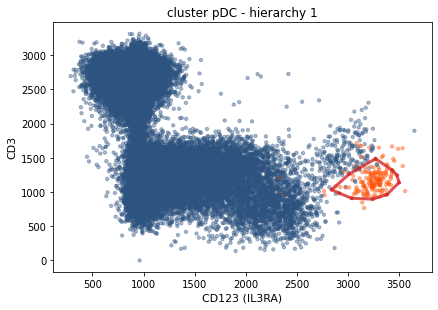

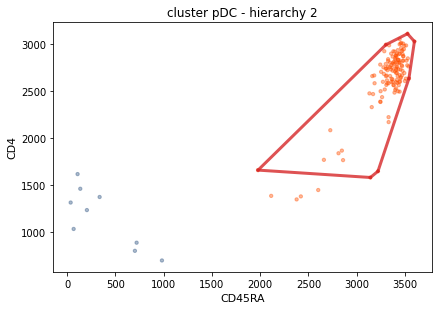

nr_targets :163
nr_non_targets :49837
nr_targets :136
nr_non_targets :9


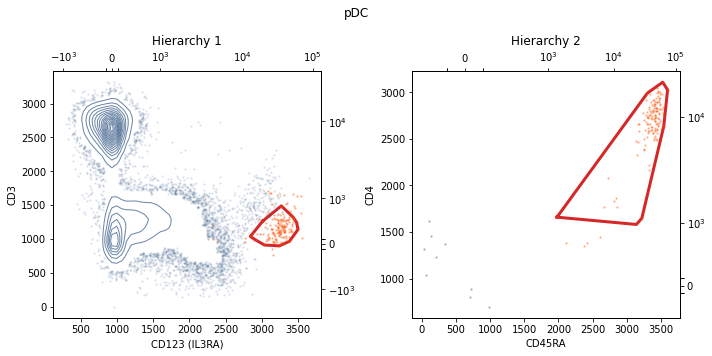

nr_targets :163
nr_non_targets :49837
nr_targets :136
nr_non_targets :9


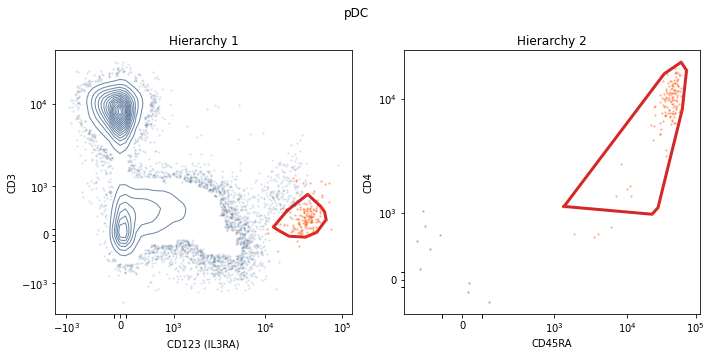

In [19]:
for cluster_key in dirIDs:
    if not cluster_key.startswith('cluster'):
        continue
    meta_info_path = os.path.join(add_hull_path, cluster_key, 'meta_info.npy')
    meta_info = np.load(meta_info_path,allow_pickle=True).item()

    population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)
    #read performance summary to obtain number of clusters
    per_summary = pd.read_csv(os.path.join(add_hull_path, cluster_key, 'performance_summary.csv'))
    num_hierarchies = np.min([per_summary['hierarchy'].max(), 5])
    run_ID =0
    for mode in ['both', 'replace']:
        path = os.path.join(population_path, f'{cluster_key}')
        save = os.path.join(population_path, f'{cluster_key}',
                    population + f'_gating_strategy_{mode}.pdf')
        save_png = os.path.join(population_path, f'{cluster_key}', population + f'_gating_strategy_{mode}.png')
        if not os.path.exists(path):
            os.makedirs(path)
        contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                                        mode=mode, transform_func=lut_func, inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

In [20]:
add_hull_path = os.path.join('./../', 'data', 'Convex_gating_test_MB','cg_lvl2_pDC_test_noCD57CD3')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)
dirIDs = os.listdir(add_hull_path)

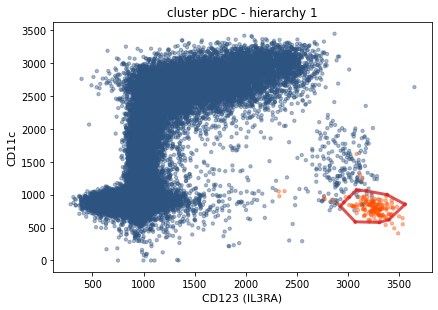

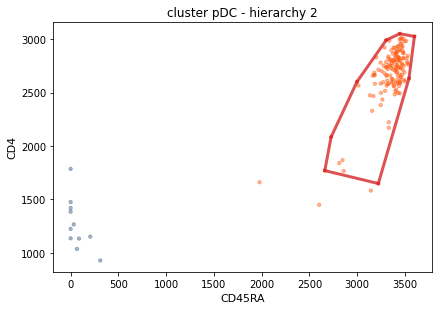

nr_targets :163
nr_non_targets :49837
nr_targets :144
nr_non_targets :11


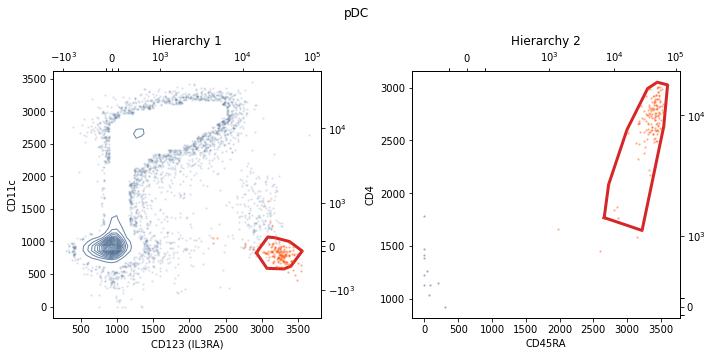

nr_targets :163
nr_non_targets :49837
nr_targets :144
nr_non_targets :11


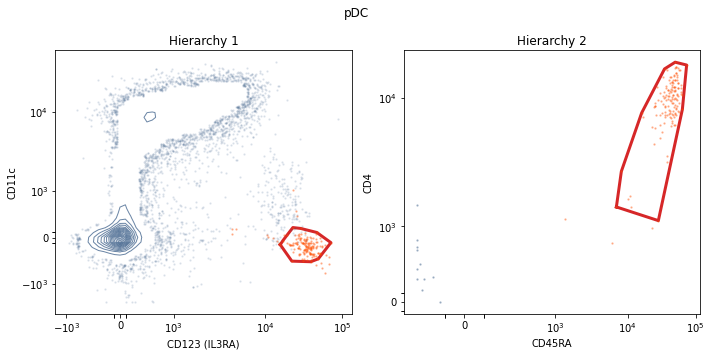

In [21]:
for cluster_key in dirIDs:
    if not cluster_key.startswith('cluster'):
        continue
    meta_info_path = os.path.join(add_hull_path, cluster_key, 'meta_info.npy')
    meta_info = np.load(meta_info_path,allow_pickle=True).item()

    population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)
    #read performance summary to obtain number of clusters
    per_summary = pd.read_csv(os.path.join(add_hull_path, cluster_key, 'performance_summary.csv'))
    num_hierarchies = np.min([per_summary['hierarchy'].max(), 5])
    run_ID =0
    for mode in ['both', 'replace']:
        path = os.path.join(population_path, f'{cluster_key}')
        save = os.path.join(population_path, f'{cluster_key}',
                    population + f'_gating_strategy_{mode}.pdf')
        save_png = os.path.join(population_path, f'{cluster_key}', population + f'_gating_strategy_{mode}.png')
        if not os.path.exists(path):
            os.makedirs(path)
        contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                                        mode=mode, transform_func=lut_func, inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

In [22]:
add_hull_path = os.path.join('./../', 'data', 'Convex_gating_test_MB','cg_lvl2_pDC_test_noCD57CD3CD11c')
if not os.path.exists(add_hull_path):
    os.mkdir(add_hull_path)
dirIDs = os.listdir(add_hull_path)

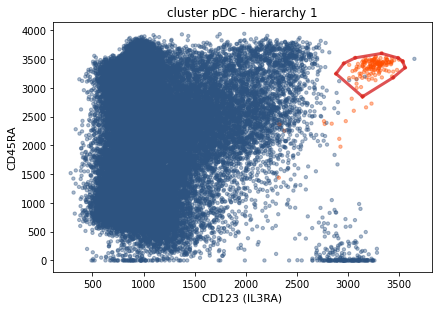

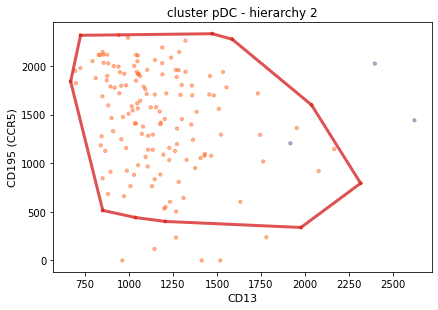

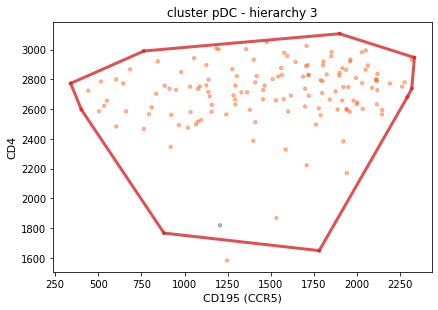

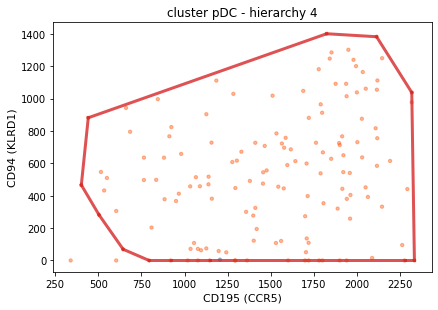

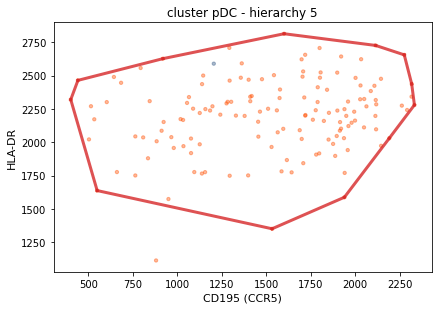

nr_targets :163
nr_non_targets :49837


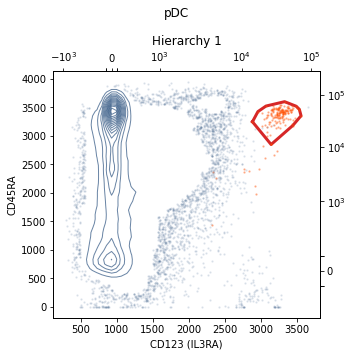

nr_targets :163
nr_non_targets :49837


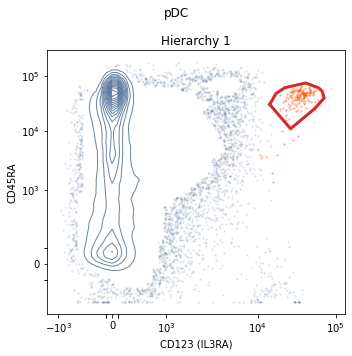

In [23]:
for cluster_key in dirIDs:
    if not cluster_key.startswith('cluster'):
        continue
    meta_info_path = os.path.join(add_hull_path, cluster_key, 'meta_info.npy')
    meta_info = np.load(meta_info_path,allow_pickle=True).item()

    population,population_path,base_df = prepare_contour_plot(meta_info = meta_info,
                                                          add_hull_path = add_hull_path,
                                                          run_ID =0)
    #read performance summary to obtain number of clusters
    per_summary = pd.read_csv(os.path.join(add_hull_path, cluster_key, 'performance_summary.csv'))
    num_hierarchies = np.min([per_summary['hierarchy'].max(), 5])
    run_ID =0
    for mode in ['both', 'replace']:
        path = os.path.join(population_path, f'{cluster_key}')
        save = os.path.join(population_path, f'{cluster_key}',
                    population + f'_gating_strategy_{mode}.pdf')
        save_png = os.path.join(population_path, f'{cluster_key}', population + f'_gating_strategy_{mode}.png')
        if not os.path.exists(path):
            os.makedirs(path)
        contour_lines_separate_outliers(meta_info, run_ID, base_df, population,population_path,
                    num_hierarchies=num_hierarchies, pop_min=500,
                                        mode=mode, transform_func=lut_func, inverse_transform_func=inverse_lut_func,
                        save = save,save_png=save_png)

### Plot final performance as dotplot

In [118]:
colors = {
"f1": "#663171",
"recall": "#e2998a",
"precision": "#0c7156",
}

Load performance metrics.

In [129]:
data_path = './../data/Convex_gating_test_MB/'
files = os.listdir(data_path)
cg_lvl2 = [fileID for fileID in files if fileID.startswith('cg_lvl2')]
performance_dict = {}
for dirID in cg_lvl2:
    if dirID.count('only')>0 or dirID.count('noCD57CD3CD4CD11c')>0:
        continue
    performance_dict[dirID] = pd.read_csv(os.path.join(data_path,dirID, 
                                               'cluster_pDC', 'performance_summary.csv'), 
                                          index_col=0)
    performance_dict[dirID]['scenario'] = dirID

In [149]:
scores = pd.concat(performance_dict, ignore_index=True)

In [150]:
scores

,f1,recall,precision,hierarchy,scenario
0,0.750958,0.601227,1.000000,2,cg_lvl2
1,0.894915,0.809816,1.000000,2,cg_lvl2_pDC_test_noCD57
2,0.927632,0.865031,1.000000,2,cg_lvl2_pDC_test_noCD57CD3
3,0.949367,0.920245,0.980392,1,cg_lvl2_pDC_test_noCD57CD3CD11c


In [152]:
scores = scores.drop('hierarchy', axis=1)

Rename scenarios for plotting.

In [153]:
scenario_names = {
 'cg_lvl2' : 'full',
    'cg_lvl2_pDC_test_noCD57' : '- CD57',
    'cg_lvl2_pDC_test_noCD57CD3' : '- CD57 CD3',
    'cg_lvl2_pDC_test_noCD57CD3CD11c' : '- CD57 CD3 CD11c'
}

In [154]:
scores['scenario'] = scores['scenario'].map(scenario_names)

In [155]:
scoresm = pd.melt(scores, id_vars = ['scenario'])

In [156]:
scoresm.head()

,scenario,variable,value
0,full,f1,0.750958
1,- CD57,f1,0.894915
2,- CD57 CD3,f1,0.927632
3,- CD57 CD3 CD11c,f1,0.949367
4,full,recall,0.601227


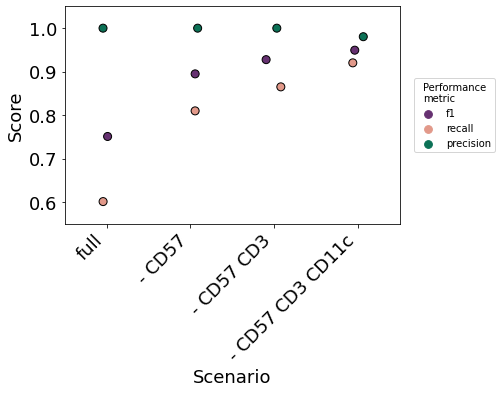

In [196]:
fig, ax = plt.subplots()

sns.stripplot(data=scoresm, x='scenario', y='value', hue='variable', edgecolor='k', 
               linewidth=1, size=8,
              palette=colors)
plt.ylabel('Score', fontsize=18)
plt.ylim([0.55,1.05])
plt.xlabel('Scenario', fontsize=18)
sns.move_legend(ax, loc='right',bbox_to_anchor=(1.3, 0.5), title='Performance\nmetric')

labelsy = [round(item,1) for item in ax.get_yticks()]

ax.set_yticklabels(labelsy, fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=18, rotation=45, ha='right')
plt.savefig(f'./../figures/{today}_pDC_scenario_performance.pdf', bbox_inches='tight')
plt.show()

### Plot density distribution of marker intensities for pDCs vs rest

In [104]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Using seaborn and matplotlib (most common approach)
def create_ridgeplot_seaborn(data, features, group_col, figsize=(10, 15)):
    """
    Create a ridgeplot using seaborn and matplotlib
    
    Parameters:
    data: DataFrame with features and group column
    features: list of feature column names
    group_col: name of the group column
    figsize: tuple for figure size
    """
    n_features = len(features)
    fig, axes = plt.subplots(n_features, 1, figsize=figsize, sharex=True)
    
    # Define colors for groups
    colors = ['#1f77b4', '#ff7f0e']  # Blue and orange
    groups = data[group_col].unique()
    
    for i, feature in enumerate(features):
        ax = axes[i] if n_features > 1 else axes
        
        # Plot density for each group
        for j, group in enumerate(groups):
            group_data = data[data[group_col] == group][feature].dropna()
            
            # Create density plot
            density = stats.gaussian_kde(group_data)
            xs = np.linspace(group_data.min(), group_data.max(), 200)
            ys = density(xs)
            
            # Normalize and offset for ridge effect
            ys = ys / ys.max() * 0.8  # Scale down
            ys = ys + i  # Offset vertically
            
            ax.fill_between(xs, i, ys, alpha=0.7, color=colors[j], label=group if i == 0 else "")
            ax.plot(xs, ys, color=colors[j], linewidth=1.5)
        
        # Customize subplot
        ax.set_ylim(i - 0.1, i + 1)
        ax.set_ylabel(feature, rotation=0, ha='right', va='center')
        ax.set_yticks([])
        
        # Remove spines
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        
        if i < n_features - 1:
            ax.spines['bottom'].set_visible(False)
            ax.set_xticks([])
    
    # Add legend and title
    if n_features > 1:
        axes[0].legend(bbox_to_anchor=(1.0,0.75))
    else:
        axes.legend(bbox_to_anchor=(1.0,0.75))
    
    plt.suptitle('Feature Distributions by Group', fontsize=16, y=0.98)
    plt.xlabel('Marker intensity distribution')
    plt.tight_layout()
    return fig

Reformat the adata object to create distribution density plots.

In [76]:
adata = sc.read(adata_path)

#pre-process data
cell_data = cg.preprocess_adata_gating(adata, cluster_string = key)

Let us mask all other groups as 'non-target' population.

In [78]:
cell_data.columns

Index(['CD32', 'CD16', 'CD19', 'IgD', 'CD4', 'CD64', 'CD14', 'CD57', 'CD3',
       'live/dead', 'PD-1', 'CD15', 'CD27', 'CD20', 'CD197 (CCR7)', 'CD45RA',
       'CD94 (KLRD1)', 'CD195 (CCR5)', 'CD8', 'CD38', 'CD11c', 'CD13',
       'CD123 (IL3RA)', 'CD25', 'CD127 (IL7RA)', 'CD56', 'HLA-DR',
       'cluster cell_type_lvl_2', 'cell_ID'],
      dtype='object')

In [80]:
cell_data['cluster cell_type_lvl_2'] = cell_data['cluster cell_type_lvl_2'].cat.add_categories('non-target')

In [81]:
cell_data['population'] = cell_data['cluster cell_type_lvl_2'].mask(cell_data['cluster cell_type_lvl_2'].ne('pDC'), 
                                                                    'non-target')

In [85]:
cell_data['population'] = cell_data['population'].cat.remove_unused_categories()
cell_data['cluster cell_type_lvl_2'] = cell_data['cluster cell_type_lvl_2'].cat.remove_unused_categories()

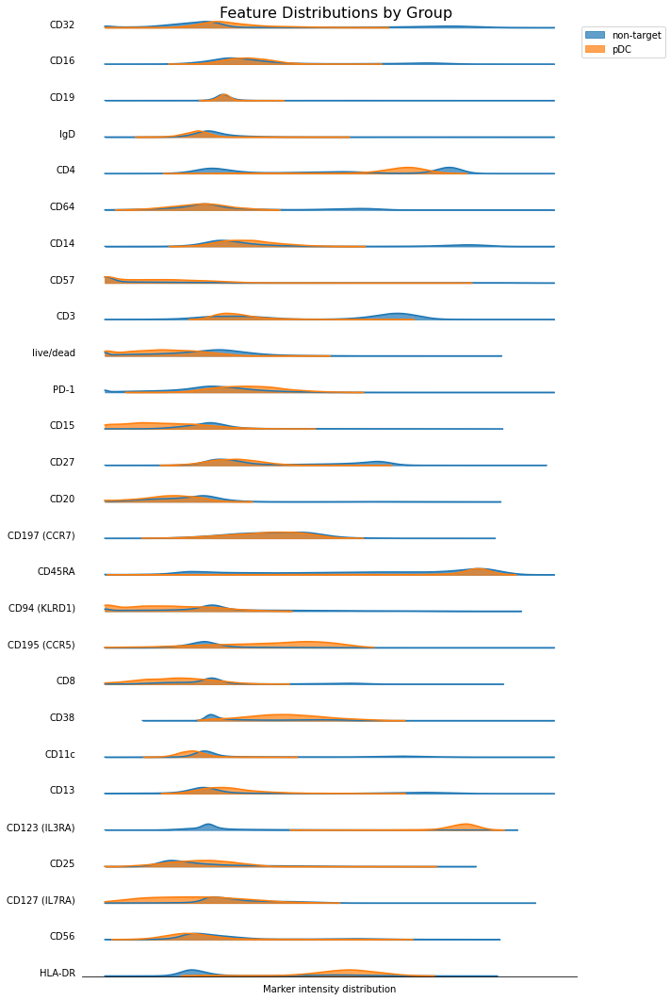

In [194]:
feature_columns = list(cell_data.columns[:-3])  # List of features
group_column = 'population'  # Group column name
 
fig = create_ridgeplot_seaborn(cell_data, feature_columns, group_column)
plt.savefig(f'../figures/{today}_pDC_marker_intensity_distribution.pdf', bbox_inches='tight')
plt.show()


End of the notebook.